# **Project Title ▶**
# **MelanoAI : Intelligent Skin Cancer Screening**

---

## **Objective:** Build an Artificial Intelligence model to accurately classify skin lesions as benign or malignant, and provide a user-friendly interface for interaction.



## **Project Workflow:**
1. Data Collection and Exploration
2. Exploratory Data Analysis (EDA)
3. Data Preprocessing
4. Model Building
5. Model Evaluation
6. Deployment and Documentation


---



# **Importing Required Libraries**

### **Importing the necessary libraries for file handling, numerical operations, plotting, and image processing**

In [2]:
# Install required libraries (quiet mode)
%pip install -q ImageHash imageio
%pip install -q --upgrade tensorflow
%matplotlib inline

# Import libraries
import os
import pandas as pd
import zipfile
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageStat
import random
import imagehash
import hashlib
import cv2
from collections import defaultdict
import imageio.v2 as imageio
from skimage.feature import local_binary_pattern
from skimage.filters import gabor
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam

# **Upload the Dataset**

### **Upload the ZIP file then Extract the ZIP file**

In [3]:
zip_path = 'archive (1).zip'
extract_path = 'extracted_files/'

if os.path.exists(zip_path):
    os.makedirs(extract_path, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Extracted files:", os.listdir(extract_path))
else:
    print(f"'{zip_path}' not found.")

Extracted files: ['melanoma_cancer_dataset']


## **Listing Dataset Contents**

In [4]:
# Define the path to the extracted data
extracted_folder = 'extracted_files/melanoma_cancer_dataset'

# Initialize a list to hold the directory contents
directory_contents = [{'Directory': 'Dataset', 'Contents': os.listdir(extracted_folder)}]

# List the contents of ('train' and 'test') directories
for item in os.listdir(extracted_folder):
    item_path = os.path.join(extracted_folder, item)
    if os.path.isdir(item_path):
        directory_contents.append({'Directory': item, 'Contents': os.listdir(item_path)})

# Create a DataFrame to store the contents
df_contents = pd.DataFrame(directory_contents)

In [5]:
df_contents

,Directory,Contents
0,Dataset,"[train, test]"
1,train,"[malignant, benign]"
2,test,"[malignant, benign]"


# **Count the Number of Images in each Category**

### **Now, let’s count how many images are present in each category (benign and malignant) for both the training and test sets.**

In [6]:
# Define the paths to the train and test directories
paths = {
    'train/benign': 'extracted_files/melanoma_cancer_dataset/train/benign',
    'train/malignant': 'extracted_files/melanoma_cancer_dataset/train/malignant',
    'test/benign': 'extracted_files/melanoma_cancer_dataset/test/benign',
    'test/malignant': 'extracted_files/melanoma_cancer_dataset/test/malignant'
}

# Count the number of images in each category
image_counts = {category: len(os.listdir(path)) for category, path in paths.items()}

# Create a DataFrame to store the counts
df_counts = pd.DataFrame(list(image_counts.items()), columns=['Category', 'Image Count'])

In [7]:
df_counts

,Category,Image Count
0,train/benign,5000
1,train/malignant,4605
2,test/benign,500
3,test/malignant,500


# **Display Sample Images**

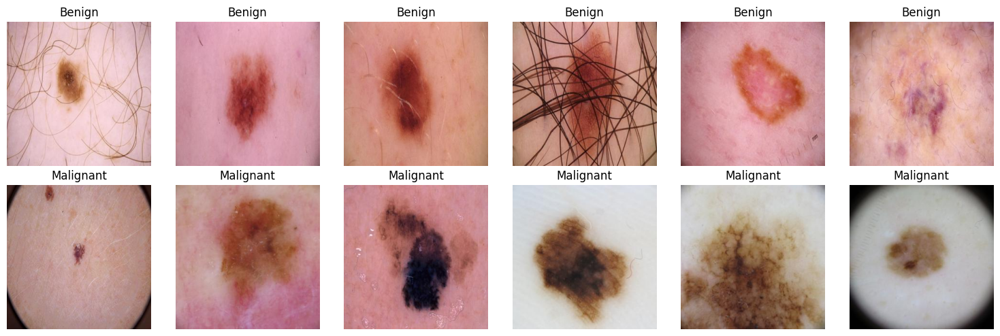

In [8]:
# Function to load and randomly select images from a category
def load_random_images(folder, num_images=1):
    all_images = os.listdir(folder)
    selected_images = random.sample(all_images, num_images)  # Randomly select images
    return [Image.open(os.path.join(folder, img)) for img in selected_images]

# Function to load random images from both train and test sets
def load_category_images(train_path, test_path, category, num_images=1):
    return load_random_images(os.path.join(train_path, category), num_images) + \
           load_random_images(os.path.join(test_path, category), num_images)

# Define paths to the train and test directories
train_path = 'extracted_files/melanoma_cancer_dataset/train'
test_path = 'extracted_files/melanoma_cancer_dataset/test'

# Number of random images to display from each category
num_images_to_display = 6  # Adjust as needed

# Load random images from both categories
benign_images = load_category_images(train_path, test_path, 'benign', num_images_to_display)
malignant_images = load_category_images(train_path, test_path, 'malignant', num_images_to_display)

# Prepare for displaying images
fig, axes = plt.subplots(2, num_images_to_display, figsize=(15, 5))

# Display benign and malignant images
for ax, img in zip(axes[0], benign_images):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title("Benign")

for ax, img in zip(axes[1], malignant_images):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title("Malignant")

plt.tight_layout()
plt.show()

# **Visualization: Class Distribution**

## **Grouped Bar Chart**

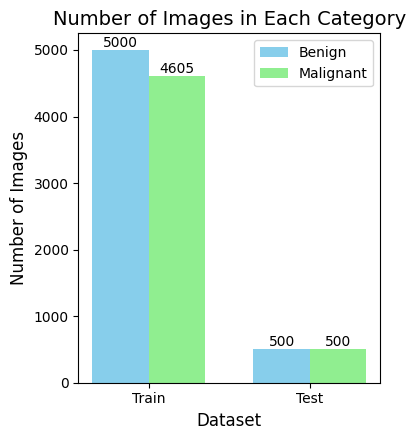

In [9]:
# Define paths to train and test directories
train_path = 'extracted_files/melanoma_cancer_dataset/train'
test_path = 'extracted_files/melanoma_cancer_dataset/test'

# Count the number of images in each category
counts = {
    "Train": {
        "Benign": len(os.listdir(os.path.join(train_path, 'benign'))),
        "Malignant": len(os.listdir(os.path.join(train_path, 'malignant')))
    },
    "Test": {
        "Benign": len(os.listdir(os.path.join(test_path, 'benign'))),
        "Malignant": len(os.listdir(os.path.join(test_path, 'malignant')))
    }
}

# Prepare data for visualization
categories = ['Train', 'Test']
benign_counts = [counts["Train"]["Benign"], counts["Test"]["Benign"]]
malignant_counts = [counts["Train"]["Malignant"], counts["Test"]["Malignant"]]

# Set up the bar width and positions
bar_width = 0.35
x = np.arange(len(categories))

# Create a grouped bar chart
plt.figure(figsize=(4, 4.5))  # Adjusted figure size
bars1 = plt.bar(x - bar_width / 2, benign_counts, bar_width, label='Benign', color='skyblue')
bars2 = plt.bar(x + bar_width / 2, malignant_counts, bar_width, label='Malignant', color='lightgreen')

# Add titles and labels
plt.title('Number of Images in Each Category', fontsize=14)
plt.xlabel('Dataset', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.xticks(x, categories)
plt.legend()

# Add value labels on top of the bars
for bar in bars1 + bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, yval, ha='center', va='bottom', fontsize=10)

plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

## **Visualizing the Class Distribution in Training and Testing Dataset**

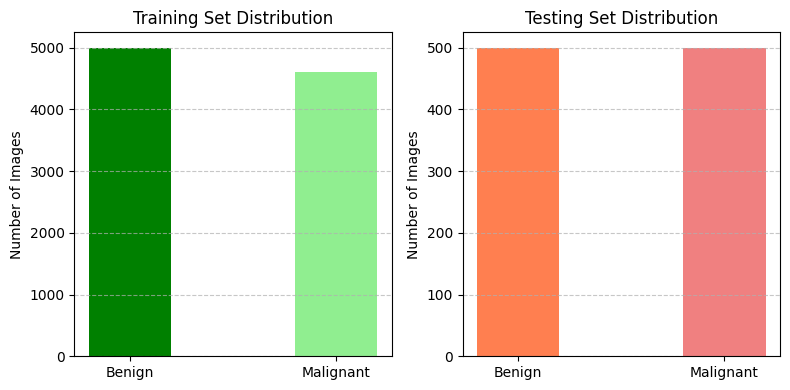

In [10]:
# Count the number of images in each category
train_counts = [len(os.listdir(os.path.join(train_path, cat))) for cat in ['benign', 'malignant']]
test_counts = [len(os.listdir(os.path.join(test_path, cat))) for cat in ['benign', 'malignant']]

# Prepare data for visualization
categories = ['Benign', 'Malignant']
x = np.arange(len(categories))
bar_width = 0.4  # Adjusted bar width for better proportion

# Create subplots for training and testing sets
fig, axes = plt.subplots(1, 2, figsize=(8, 4))  # figure size for clarity

# Training Set Bar Chart
axes[0].bar(x, train_counts, width=bar_width, color=['green', 'lightgreen'])
axes[0].set_title('Training Set Distribution', fontsize=12)
axes[0].set_ylabel('Number of Images', fontsize=10)
axes[0].set_xticks(x)
axes[0].set_xticklabels(categories)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Testing Set Bar Chart
axes[1].bar(x, test_counts, width=bar_width, color=['coral', 'lightcoral'])
axes[1].set_title('Testing Set Distribution', fontsize=12)
axes[1].set_ylabel('Number of Images', fontsize=10)
axes[1].set_xticks(x)
axes[1].set_xticklabels(categories)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

>> **The dataset is balanced in the test set but slightly imbalanced in the training set, with more benign than malignant images**

---

# **Inspect Image Properties**

### **Size and Format**

In [11]:
# Function to get unique properties of images in multiple folders
def check_image_properties(dataset_folders):
    unique_sizes = set()
    unique_formats = set()
    for folder in dataset_folders:
        for img_name in os.listdir(folder):
            img_path = os.path.join(folder, img_name)
            try:
                with Image.open(img_path) as img:
                    unique_sizes.add(img.size)
                    unique_formats.add(img.format)
            except Exception as e:
                print(f"Error processing file {img_path}: {e}")
    return unique_sizes, unique_formats

# Paths for each category folder
dataset_path = 'extracted_files/melanoma_cancer_dataset'  # Update this to your dataset path
all_folders = [os.path.join(dataset_path, split, category)
               for split in ['train', 'test'] for category in ['benign', 'malignant']]

# Check and display properties
unique_sizes, unique_formats = check_image_properties(all_folders)
if len(unique_sizes) == 1 and len(unique_formats) == 1:
    print(f"All images have the same size: {list(unique_sizes)[0]} and format: {list(unique_formats)[0]}.")
else:
    print(f"Image sizes: {unique_sizes}")
    print(f"Image formats: {unique_formats}")

All images have the same size: (300, 300) and format: JPEG.


>> **The dataset's images are consistently sized, which is beneficial for uniform processing in model training and avoids the need for resizing during preprocessing**

---

# **Checking for Corrupted Images in the Dataset**

In [12]:
# Function to check for corrupted images in a specified folder
def check_corrupted_images(folder_path):
    corrupted_images = []
    for img in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img)
        if os.path.isfile(img_path):
            try:
                Image.open(img_path)
            except Exception:
                corrupted_images.append(img_path)
    return corrupted_images

# Define paths for benign and malignant image folders
dataset_path = 'extracted_files/melanoma_cancer_dataset'
paths = [
    os.path.join(dataset_path, 'train', 'benign'),
    os.path.join(dataset_path, 'train', 'malignant'),
    os.path.join(dataset_path, 'test', 'benign'),
    os.path.join(dataset_path, 'test', 'malignant')
]

# Check for corrupted images in all specified folders
corrupted_images = [check_corrupted_images(path) for path in paths]

# Print the summary of corrupted images
has_corrupted_images = False
for category, corrupted in zip(['Benign', 'Malignant', 'Test Benign', 'Test Malignant'], corrupted_images):
    if corrupted:
        has_corrupted_images = True
        print(f"There are some corrupted images in {category}:")
        print('\n'.join(corrupted))

if not has_corrupted_images:
    print("There are no corrupted images in the dataset.")

There are no corrupted images in the dataset.


> **We don't need to handle corrupted images since the dataset is confirmed to be free of them**

---



# **Check for Duplicate Images**

In [13]:
# Function to find and optionally remove duplicate images using perceptual hashing
def find_and_remove_duplicates(image_dir, remove=False):
    image_hashes = {}
    duplicates = []

    if not os.path.isdir(image_dir):
        print(f"Directory does not exist: {image_dir}")
        return duplicates

    for filename in os.listdir(image_dir):
        # Convert filename to lowercase to support all image extensions
        if filename.lower().endswith((".png", ".jpg", ".jpeg")):
            img_path = os.path.join(image_dir, filename)
            try:
                with Image.open(img_path) as img:
                    # Generate a perceptual hash for the image
                    img_hash = imagehash.phash(img)

                    if img_hash in image_hashes:
                        # Duplicate found, store original and duplicate paths
                        duplicates.append((image_hashes[img_hash], img_path))
                        if remove:
                            os.remove(img_path)
                    else:
                        # Store the hash and image path if no duplicate is found
                        image_hashes[img_hash] = img_path
            except Exception as e:
                print(f"Error processing {img_path}, error: {e}")

    return duplicates

# Define paths to the dataset folders
train_path = 'extracted_files/melanoma_cancer_dataset/train'
test_path = 'extracted_files/melanoma_cancer_dataset/test'

# Initialize duplicate lists
train_benign_duplicates = find_and_remove_duplicates(os.path.join(train_path, 'benign'))
train_malignant_duplicates = find_and_remove_duplicates(os.path.join(train_path, 'malignant'))
test_benign_duplicates = find_and_remove_duplicates(os.path.join(test_path, 'benign'))
test_malignant_duplicates = find_and_remove_duplicates(os.path.join(test_path, 'malignant'))

# Calculate the total duplicates across all categories
total_duplicates = (len(train_benign_duplicates) + len(train_malignant_duplicates) +
                    len(test_benign_duplicates) + len(test_malignant_duplicates))

# Display only the total duplicate count
print(f"Total Number of duplicate images: {total_duplicates}")

# Optionally, store results in a DataFrame for reference
data = {
    'Category': ['train_benign', 'train_malignant', 'test_benign', 'test_malignant'],
    'Duplicate Count': [len(train_benign_duplicates), len(train_malignant_duplicates),
                        len(test_benign_duplicates), len(test_malignant_duplicates)]
}
df_counts = pd.DataFrame(data)
df_counts.to_csv('duplicate_image_counts.csv', index=False)


Total Number of duplicate images: 27


In [14]:
df_counts

,Category,Duplicate Count
0,train_benign,8
1,train_malignant,18
2,test_benign,1
3,test_malignant,0


# **Displaying few Duplicates**

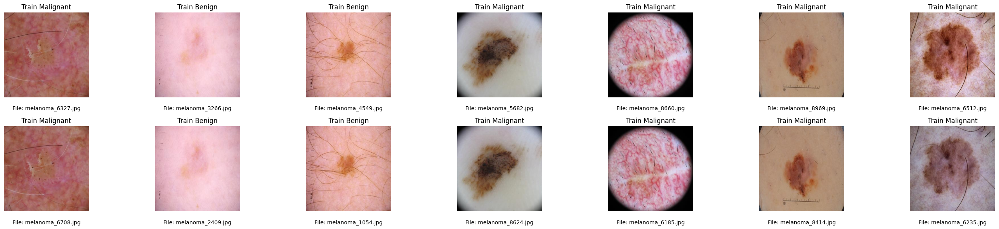

In [15]:
# Combine all duplicates into a single list for random selection
all_duplicates = train_benign_duplicates + train_malignant_duplicates + test_benign_duplicates + test_malignant_duplicates

# Function to display random duplicates
def display_mixed_random_duplicates(all_duplicates, num_samples=3):
    selected_duplicates = random.sample(all_duplicates, min(len(all_duplicates), num_samples))
    fig, axes = plt.subplots(2, len(selected_duplicates), figsize=(4 * len(selected_duplicates), 6), squeeze=False)
    fig.subplots_adjust(hspace=0, wspace=0)

    for i, (dup_path, orig_path) in enumerate(selected_duplicates):
        for ax, img_path in zip(axes[:, i], [orig_path, dup_path]):
            ax.imshow(Image.open(img_path))
            ax.axis('off')
            filename = os.path.basename(img_path)
            category = os.path.basename(os.path.dirname(img_path))
            category_map = {'benign': 'Train Benign', 'malignant': 'Train Malignant',
                            'test_benign': 'Test Benign', 'test_malignant': 'Test Malignant'}
            ax.set_title(category_map.get(category, 'Unknown'))
            ax.text(0.5, -0.1, f"File: {filename}", ha='center', va='top', transform=ax.transAxes, fontsize=10)

    plt.tight_layout()
    plt.show()

# Display a selection of mixed random duplicates
display_mixed_random_duplicates(all_duplicates, num_samples=7)


# **Removing Duplicates**

In [16]:
# Function to remove duplicates while keeping only one instance of each
def remove_duplicates(duplicates):
    for duplicate in duplicates:
        # Each entry in `duplicates` is a tuple (duplicate_image_path, original_image_path)
        duplicate_image_path = duplicate[0]
        try:
            os.remove(duplicate_image_path)  # Remove the duplicate image
        except Exception:
            # Skip error message for files that cannot be deleted
            continue

# Remove duplicates in each category
remove_duplicates(train_benign_duplicates)
remove_duplicates(train_malignant_duplicates)
remove_duplicates(test_benign_duplicates)
remove_duplicates(test_malignant_duplicates)

# Print success message once after all duplicates are removed
print("All duplicates have been removed, keeping only one copy of each image.")

# Count images after duplicate removal
num_train_benign_after = len(os.listdir(os.path.join(train_path, 'benign')))
num_train_malignant_after = len(os.listdir(os.path.join(train_path, 'malignant')))
num_test_benign_after = len(os.listdir(os.path.join(test_path, 'benign')))
num_test_malignant_after = len(os.listdir(os.path.join(test_path, 'malignant')))

# Update DataFrame with post-removal counts
df_counts['Image Count After Removal'] = [num_train_benign_after, num_train_malignant_after,
                                          num_test_benign_after, num_test_malignant_after]

# Optionally, save the updated DataFrame to a CSV file
df_counts.to_csv('image_counts_post_duplicate_removal.csv', index=False)


All duplicates have been removed, keeping only one copy of each image.


In [17]:
df_counts

,Category,Duplicate Count,Image Count After Removal
0,train_benign,8,4992
1,train_malignant,18,4587
2,test_benign,1,499
3,test_malignant,0,500


>>**The duplicate image analysis shows a small number of duplicates,
with minimal impact on overall counts. The train malignant category had the most duplicates (18), leaving 4,587 unique images. The test benign category had only one duplicate, reducing it to 499 images. Overall, the process effectively maintained a robust dataset**

---



# **Texture Analysis**

## **Texture Analysis Using LBP and Gabor Features**

>**Local Binary Patterns (LBP):**
extract texture features by comparing each pixel's intensity with its neighbors, creating a unique binary pattern that captures local textures. This method is effective for tasks like texture classification and face recognition.

>**Gabor Features:** use Gabor filters to analyze an image's frequency content at different scales and orientations. They capture edge and texture details, making them useful for distinguishing textures and identifying patterns in images, particularly in medical imaging and object detection.

In [18]:
# Function to extract texture features
def extract_texture_features(image_path):
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (128, 128))
    lbp = local_binary_pattern(image_resized[:, :, 0], 8, 1, method="uniform")
    lbp_hist, _ = np.histogram(lbp, bins=np.arange(0, 11), density=True)
    gabor_features = [gabor(image_resized[:, :, 0], frequency=0.6, theta=theta / 4. * np.pi)[0].mean() for theta in range(4)]
    return np.hstack((lbp_hist, gabor_features))

# Function to process directories
def process_directory(directory):
    features, labels = [], []
    for category in os.listdir(directory):
        for filename in os.listdir(os.path.join(directory, category)):
            image_path = os.path.join(directory, category, filename)
            features.append(extract_texture_features(image_path))
            labels.append(category)
    return np.array(features), labels

# Paths and processing
train_features, train_labels = process_directory('extracted_files/melanoma_cancer_dataset/train')
test_features, test_labels = process_directory('extracted_files/melanoma_cancer_dataset/test')

# DataFrame creation
lbp_bins = [f'LBP_Bin_{i}' for i in range(len(train_features[0]) - 4)]
feature_names = lbp_bins + [f'Gabor_Mean_{i}' for i in range(4)]
train_df = pd.DataFrame(train_features, columns=feature_names).assign(label=train_labels)
test_df = pd.DataFrame(test_features, columns=feature_names).assign(label=test_labels)

# Save to CSV
train_df.to_csv('train_texture_features.csv', index=False)
test_df.to_csv('test_texture_features.csv', index=False)

# Display results
print(f"Training set features: {train_df.shape}")
print(f"Testing set features: {test_df.shape}")


Training set features: (9579, 15)
Testing set features: (999, 15)


>>1. **The dataset includes 10 Local Binary Pattern (LBP) bins and 4Gabor mean values per image, capturing detailed texture patterns useful for classifying images as benign or malignant.**

>>2. **LBP bins represent pixel patterns, and Gabor features capture texture at different orientations, enhancing the model's potential to distinguish between lesion types.**

In [19]:
print(f"Sample extracted features from training set:")
train_df.head()

Sample extracted features from training set:


,LBP_Bin_0,LBP_Bin_1,LBP_Bin_2,LBP_Bin_3,LBP_Bin_4,LBP_Bin_5,LBP_Bin_6,LBP_Bin_7,LBP_Bin_8,LBP_Bin_9,Gabor_Mean_0,Gabor_Mean_1,Gabor_Mean_2,Gabor_Mean_3,label
0,0.060181,0.085449,0.065979,0.112122,0.139282,0.126587,0.082520,0.090149,0.090088,0.147644,10.869507,10.849854,10.999817,10.034851,malignant
1,0.082336,0.099304,0.059204,0.080505,0.088440,0.096558,0.080688,0.105164,0.116943,0.190857,11.017639,7.196838,11.196289,7.136292,malignant
2,0.077759,0.094971,0.068665,0.087891,0.096863,0.101685,0.087646,0.093933,0.109070,0.181519,9.884644,2.701965,9.883728,3.175415,malignant
3,0.056274,0.075623,0.063965,0.123657,0.147095,0.136047,0.090698,0.083618,0.086182,0.136841,10.916504,7.875183,10.953552,7.862488,malignant
4,0.043091,0.082397,0.042358,0.093262,0.099243,0.146484,0.098816,0.094788,0.137329,0.162231,8.301514,3.201233,7.736267,3.201843,malignant


In [20]:
print(f"Sample extracted features from testing set:")
test_df.head()

Sample extracted features from testing set:


,LBP_Bin_0,LBP_Bin_1,LBP_Bin_2,LBP_Bin_3,LBP_Bin_4,LBP_Bin_5,LBP_Bin_6,LBP_Bin_7,LBP_Bin_8,LBP_Bin_9,Gabor_Mean_0,Gabor_Mean_1,Gabor_Mean_2,Gabor_Mean_3,label
0,0.020874,0.024597,0.017639,0.049866,0.124146,0.097961,0.027161,0.031677,0.558533,0.047546,6.971985,8.415527,7.898071,8.149841,malignant
1,0.054199,0.072083,0.054138,0.110962,0.169189,0.153259,0.083130,0.079346,0.089050,0.134644,9.014587,3.883606,9.126709,3.850159,malignant
2,0.078003,0.088013,0.068909,0.105713,0.124207,0.104309,0.082458,0.087402,0.097412,0.163574,12.505981,6.919006,12.375122,6.461243,malignant
3,0.048523,0.065430,0.060486,0.135742,0.199097,0.146667,0.084839,0.068176,0.073364,0.117676,9.196899,4.578918,9.385376,4.688232,malignant
4,0.054382,0.065369,0.050232,0.111877,0.249756,0.125122,0.069031,0.069824,0.087891,0.116516,10.359680,7.742126,10.378662,7.899170,malignant


# **Visualization: Feature distributions**

In [21]:
# Function to visualize feature distributions
def plot_feature_distribution(df, dataset_name):
    # Visualize the distribution of the first few features
    num_features_to_plot = min(5, df.shape[1] - 1)  # Adjust based on your number of features, excluding label column
    df.iloc[:, :-1].hist(bins=30, figsize=(15, 10))  # Exclude label column
    plt.suptitle(f'Feature Distribution in {dataset_name} Set')
    plt.show()

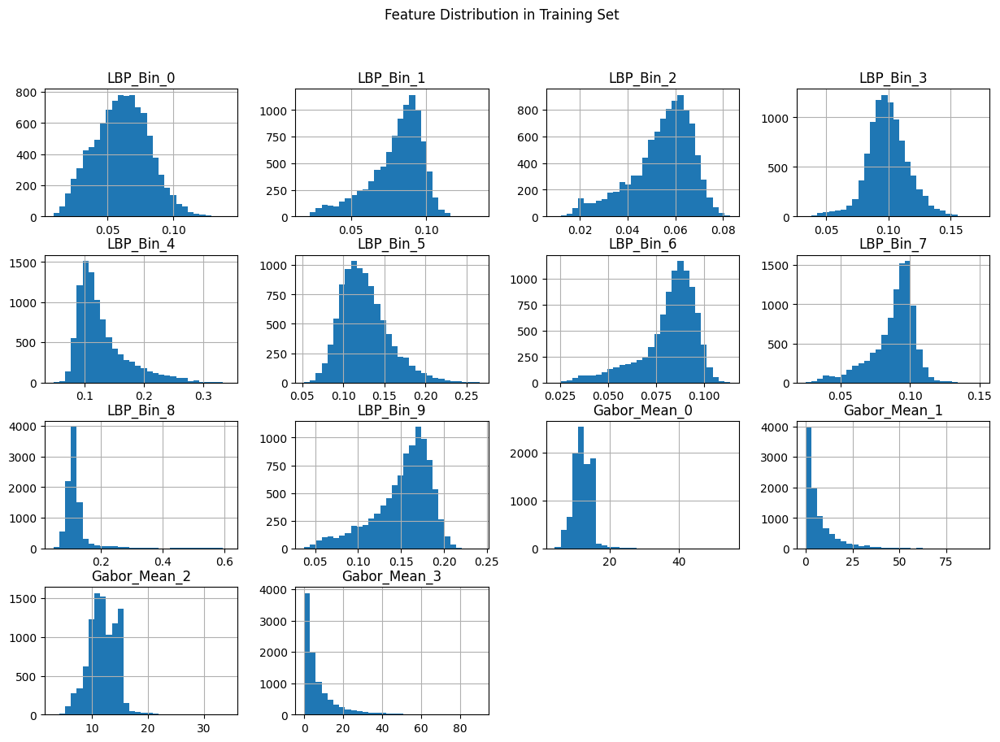

In [22]:
# Plot for testing set
plot_feature_distribution(train_df, 'Training')

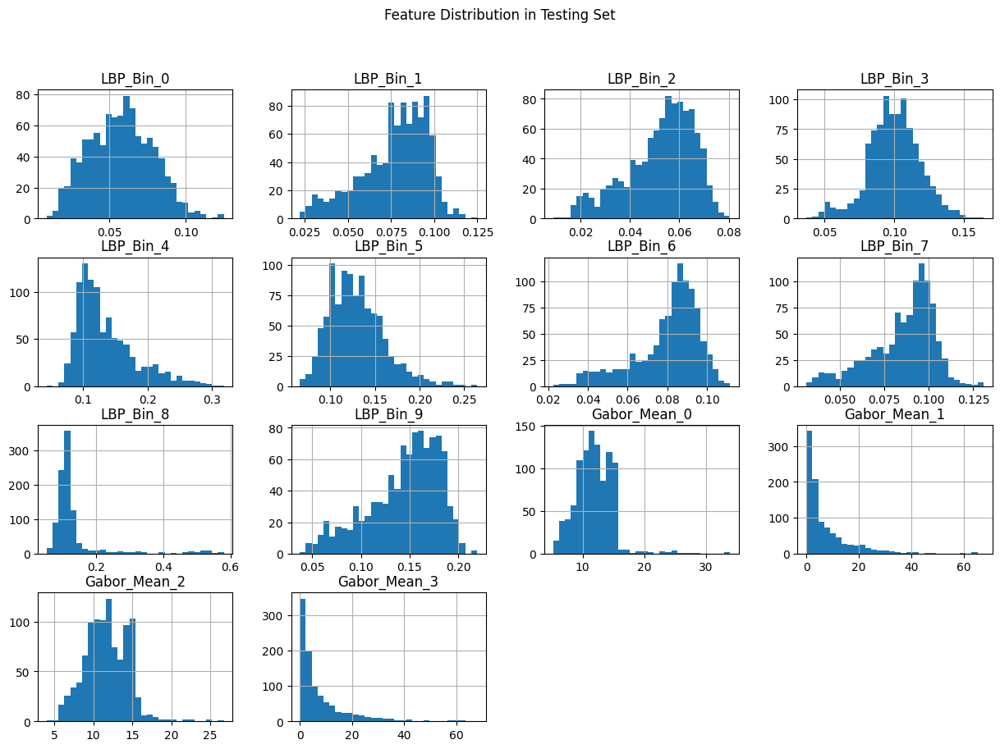

In [23]:
# Plot for testing set
plot_feature_distribution(test_df, 'Testing')

## **Insight**

**LBP Features (LBP_Bin_0 to LBP_Bin_9):**

1. Most LBP features are centered around specific values and have narrow distributions. This consistency suggests that general texture patterns are quite similar across images in the dataset.
2. A few LBP features, like LBP_Bin_8, have more values on the higher end, indicating some unique texture patterns in certain images. This could be useful for identifying specific texture characteristics.

**Gabor Features (Gabor_Mean_0 to Gabor_Mean_3):**

1. Gabor features show more spread, with some having a long tail toward higher values, meaning there’s a greater variety in texture captured by these features.
2. The wide range in Gabor values suggests these features capture unique edge and texture details, which could help distinguish between benign and malignant images.

---



# **Pixel Intensity**

In [24]:
# Define the path to your original images
dataset_path = 'extracted_files/melanoma_cancer_dataset'  # Update with your actual path

# Initialize a dictionary to store average intensities by category
intensity_totals = {
    'train_benign': [0, 0, 0],
    'train_malignant': [0, 0, 0],
    'test_benign': [0, 0, 0],
    'test_malignant': [0, 0, 0]
}
counts = {
    'train_benign': 0,
    'train_malignant': 0,
    'test_benign': 0,
    'test_malignant': 0
}

# Function to calculate average pixel intensity for an image
def calculate_average_intensity(image_path):
    image = cv2.imread(image_path)
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Calculate average pixel intensity for each channel
    avg_intensity = np.mean(image, axis=(0, 1))  # Mean across height and width
    return avg_intensity

# Traverse the dataset and compute average intensities
for subdir, _, files in os.walk(dataset_path):
    for file in files:
        file_path = os.path.join(subdir, file)
        avg_intensity = calculate_average_intensity(file_path)

        # Determine the category
        if 'train' in subdir and 'benign' in subdir:
            category = 'train_benign'
        elif 'train' in subdir and 'malignant' in subdir:
            category = 'train_malignant'
        elif 'test' in subdir and 'benign' in subdir:
            category = 'test_benign'
        elif 'test' in subdir and 'malignant' in subdir:
            category = 'test_malignant'
        else:
            continue  # Skip if category is unknown

        # Accumulate intensities and count for the category
        intensity_totals[category] += avg_intensity
        counts[category] += 1

# Calculate average intensities by category
average_intensities = {
    category: np.array(intensity_totals[category]) / count if count > 0 else [0, 0, 0]
    for category, count in counts.items()
}

# Convert to a DataFrame for display
average_intensity_df = pd.DataFrame.from_dict(average_intensities, orient='index', columns=['Average Red Intensity', 'Average Green Intensity', 'Average Blue Intensity'])
average_intensity_df.index.name = 'Category'

# Optionally, save the DataFrame to a CSV file
average_intensity_df.to_csv('overall_average_pixel_intensities.csv')

In [25]:
# Display the DataFrame with overall average intensities by category
average_intensity_df

,Average Red Intensity,Average Green Intensity,Average Blue Intensity
Category,,,
train_benign,206.045063,158.934001,151.741839
train_malignant,158.069426,129.388116,125.436840
test_benign,206.360172,159.137992,151.778429
test_malignant,148.705755,124.381911,117.105458


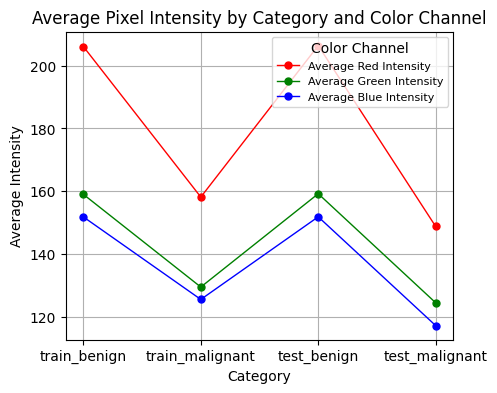

In [26]:
# Define colors for each channel
channel_colors = {
    'Average Red Intensity': 'red',
    'Average Green Intensity': 'green',
    'Average Blue Intensity': 'blue'
}

# Line plot for intensity comparisons with custom colors
plt.figure(figsize=(5, 4))
for color in average_intensity_df.columns:
    plt.plot(
        average_intensity_df.index,
        average_intensity_df[color],
        marker='o',
        label=color,
        color=channel_colors[color], # Set custom color
        markersize=5,  # Change marker size here
        linewidth=1    # Change line width here
    )

plt.xlabel('Category')
plt.ylabel('Average Intensity')
plt.title('Average Pixel Intensity by Category and Color Channel')
plt.legend(title='Color Channel',fontsize=8)
plt.grid(True)
plt.show()

>>**The analysis of average pixel intensities reveals that benign images, whether in the training or testing sets, exhibit higher average intensity values across the red, green, and blue channels when compared to malignant images**

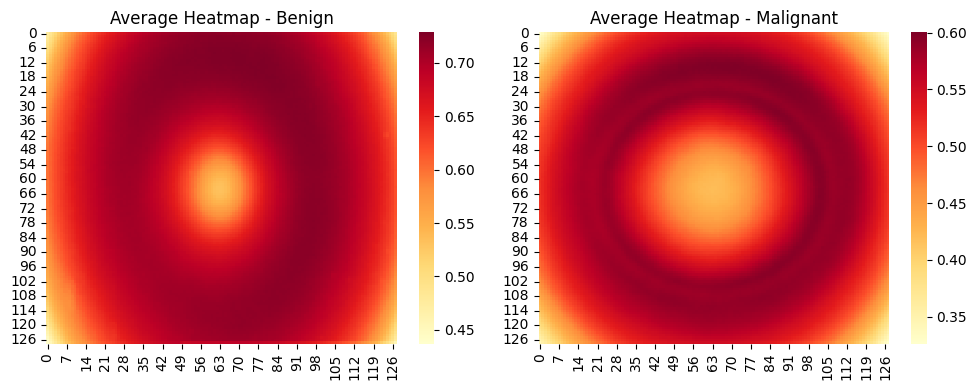

In [27]:
def calculate_mean_image(image_paths):
    # Initialize a sum array with the shape of resized images
    sum_image = np.zeros((128, 128, 3), dtype=np.float32)
    count = len(image_paths)

    # Accumulate pixel intensities across all images
    for path in image_paths:
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (128, 128))  # Resize to 128x128
        sum_image += image / 255.0  # Normalize and add

    # Calculate mean pixel intensity across all images
    mean_image = sum_image / count
    return mean_image

# Get paths for benign and malignant images
benign_paths = [os.path.join(train_path, 'benign', fname) for fname in os.listdir(os.path.join(train_path, 'benign'))]
malignant_paths = [os.path.join(train_path, 'malignant', fname) for fname in os.listdir(os.path.join(train_path, 'malignant'))]

# Calculate mean images for benign and malignant categories
mean_benign = calculate_mean_image(benign_paths)
mean_malignant = calculate_mean_image(malignant_paths)

# Plot heatmap for benign images
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.heatmap(mean_benign.mean(axis=2), cmap="YlOrRd", cbar=True)
plt.title("Average Heatmap - Benign")

# Plot heatmap for malignant images
plt.subplot(1, 2, 2)
sns.heatmap(mean_malignant.mean(axis=2), cmap="YlOrRd", cbar=True)
plt.title("Average Heatmap - Malignant")

plt.tight_layout()
plt.show()

## **Insight**
> ### The heatmaps above provide insights into the average pixel intensity distributions for benign and malignant melanoma images:

#### **Benign vs. Malignant Central Intensity Patterns:**

1. Both heatmaps show a central bright region, which indicates that both categories have higher average intensity (brightness) in the center of the images.
2. The benign image (left) has a more concentrated bright area in the center, with a gradual fade outward. In contrast, the malignant image (right) shows a broader, more diffused bright area with additional intensity rings around the center.

#### **Surrounding Regions and Symmetry:**

1. The malignant heatmap has a more evenly distributed ring-like pattern extending out from the center, suggesting that malignant images may have more texture variation across the image, possibly due to irregular borders or color variations commonly associated with melanoma.
2. The benign heatmap’s intensity fades more smoothly towards the edges, which could indicate that benign lesions have less abrupt changes in intensity, resulting in smoother borders and a more uniform appearance.

---



# **Aspect Ratio Analysis**

## **Calculating the aspect ratio**

In [28]:
# Function to calculate aspect ratios for images in a folder
def calculate_aspect_ratios(folder):
    return [Image.open(os.path.join(folder, img)).size[0] / Image.open(os.path.join(folder, img)).size[1]
            for img in os.listdir(folder) if img.endswith(('.jpg', '.png'))]

# Paths to training and testing sets
train_benign_path = os.path.join(dataset_path, 'train', 'benign')
train_malignant_path = os.path.join(dataset_path, 'train', 'malignant')
test_benign_path = os.path.join(dataset_path, 'test', 'benign')
test_malignant_path = os.path.join(dataset_path, 'test', 'malignant')

# Calculate aspect ratios
train_benign_ratios = calculate_aspect_ratios(train_benign_path)
train_malignant_ratios = calculate_aspect_ratios(train_malignant_path)
test_benign_ratios = calculate_aspect_ratios(test_benign_path)
test_malignant_ratios = calculate_aspect_ratios(test_malignant_path)

## **Calculating mean aspect ratio**

In [29]:
# Calculate mean aspect ratios
train_mean_ratio = np.mean(train_benign_ratios + train_malignant_ratios)
test_mean_ratio = np.mean(test_benign_ratios + test_malignant_ratios)

# Print the means
print(f"Mean Aspect Ratio (Train): {train_mean_ratio:.2f}")
print(f"Mean Aspect Ratio (Test): {test_mean_ratio:.2f}")

Mean Aspect Ratio (Train): 1.00
Mean Aspect Ratio (Test): 1.00


>>**The mean aspect ratio of 1.00 for both the train and test datasets indicates that the images are likely square, meaning their width and height are equal**

## **Histogram of Aspect Ratios for Train and Test Sets**

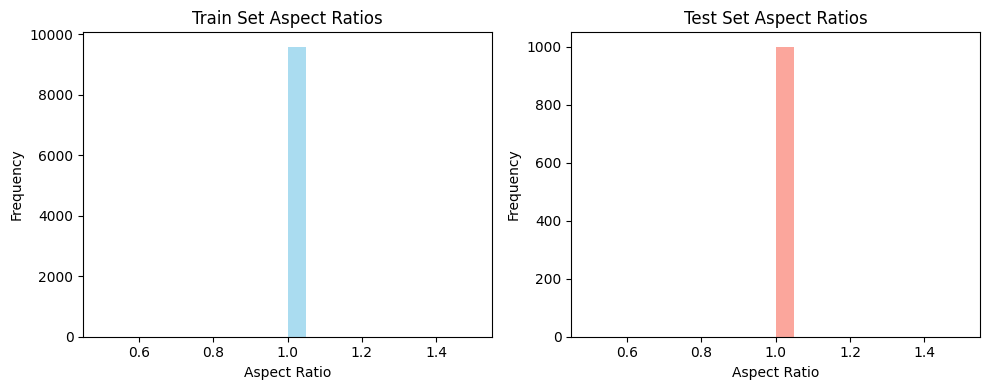

In [30]:
# Plot histograms for aspect ratios
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.hist(train_benign_ratios + train_malignant_ratios, bins=20, color='skyblue', alpha=0.7)
plt.title("Train Set Aspect Ratios")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(test_benign_ratios + test_malignant_ratios, bins=20, color='salmon', alpha=0.7)
plt.title("Test Set Aspect Ratios")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

### **Analysis**

>>**The histograms illustrate the distribution of aspect ratios for the training and test datasets. Given that the mean aspect ratio is 1.00, both histograms display peaks around this value, indicating that most images are square. Any deviations from this central value may suggest the presence of non-square images, but the overall expectation is a concentration around the aspect ratio of 1.**

In [31]:
# Print summary findings
if abs(train_mean_ratio - test_mean_ratio) < 0.1:
    print("The training and testing sets have similar aspect ratio distributions.")
else:
    print("The training and testing sets have noticeably different aspect ratio distributions.")

The training and testing sets have similar aspect ratio distributions.




---



# **Calculation of Average Color Intensities for Benign and Malignant Images in the Dataset**

In [32]:
# Function to calculate average color intensity for images in a specified folder
def calculate_average_color_intensity(folder_path):
    return [sum(ImageStat.Stat(Image.open(os.path.join(folder_path, img))).mean[:3]) / 3
            for img in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, img))]

# Define paths for train and test sets
dataset_path = 'extracted_files/melanoma_cancer_dataset'
benign_colors = calculate_average_color_intensity(os.path.join(dataset_path, 'train', 'benign')) + \
                calculate_average_color_intensity(os.path.join(dataset_path, 'test', 'benign'))
malignant_colors = calculate_average_color_intensity(os.path.join(dataset_path, 'train', 'malignant')) + \
                   calculate_average_color_intensity(os.path.join(dataset_path, 'test', 'malignant'))

# Calculate and print overall averages
print(f"Average color intensity for benign images: {sum(benign_colors) / len(benign_colors):.2f}" if benign_colors else "No benign images found.")
print(f"Average color intensity for malignant images: {sum(malignant_colors) / len(malignant_colors):.2f}" if malignant_colors else "No malignant images found.")

Average color intensity for benign images: 172.26
Average color intensity for malignant images: 136.89


>>The average color intensity for benign images is significantly higher than that for malignant images This suggests that benign images tend to have a lighter and brighter appearance, while malignant images are darker

## **Boxplot of average Color Intensities for Benign and Malignant Images**

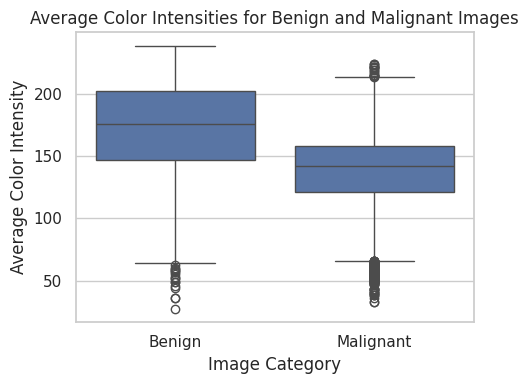

In [33]:
# Prepare data for visualization
data = {
    "Category": ["Benign"] * len(benign_colors) + ["Malignant"] * len(malignant_colors),
    "Average Color Intensity": benign_colors + malignant_colors,
}

# Create a DataFrame for seaborn
df = pd.DataFrame(data)

# Set the visual style
sns.set(style="whitegrid")

# Create a boxplot using a different color palette
plt.figure(figsize=(5, 4))
sns.boxplot(x="Category", y="Average Color Intensity", data=df)  # Using a different color palette
plt.title("Average Color Intensities for Benign and Malignant Images")
plt.xlabel("Image Category")
plt.ylabel("Average Color Intensity")
plt.tight_layout()
plt.show()

## **Insight**

####**Benign Images:**

>1. Higher median brightness and greater variability suggest a range of benign conditions.
2. Presence of darker outliers indicates some images may still appear less bright.
    
####**Malignant Images:**

>1. Lower median brightness and less variability point to a more consistent darker appearance.
2. Mostly darker outliers, with a few brighter ones.

# **Grayscaling Image Data**

## **Performing Grayscale on Train Data**

Create a Destination Directory

We are creating the destination directory to ensure there is a designated location to save the processed grayscale images, keeping our dataset organized and preventing overwriting of the original images.

In [34]:
# Define paths for the source and destination directories
dataset_path = 'extracted_files/melanoma_cancer_dataset'
gray_benign_path = os.path.join(dataset_path, 'train', 'gray_benign')
gray_malignant_path = os.path.join(dataset_path, 'train', 'gray_malignant')

# Create destination directories for grayscale images
os.makedirs(gray_benign_path, exist_ok=True)
os.makedirs(gray_malignant_path, exist_ok=True)

## **Grayscaling Benign Images**

In [35]:
# Function to convert benign images to grayscale
def convert_benign_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for benign images
benign_path = os.path.join(dataset_path, 'train', 'benign')

# Convert benign images to grayscale
convert_benign_to_grayscale(benign_path, gray_benign_path)

## **Grayscaling Malignant Images**

In [36]:
# Function to convert malignant images to grayscale
def convert_malignant_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for malignant images
malignant_path = os.path.join(dataset_path, 'train', 'malignant')

# Convert malignant images to grayscale
convert_malignant_to_grayscale(malignant_path, gray_malignant_path)

# **Counting number of Grayscale images Created**

In [37]:
# Function to count the number of images in a given folder
def count_images(folder_path):
    return len([img_file for img_file in os.listdir(folder_path) if img_file.endswith(('.png', '.jpg', '.jpeg'))])

# Count images in the benign and malignant original folders
benign_image_count = count_images(benign_path)
malignant_image_count = count_images(malignant_path)

# Count images in the grayscale folders
gray_benign_image_count = count_images(gray_benign_path)
gray_malignant_image_count = count_images(gray_malignant_path)

# Print the counts
print(f'Number of original benign images: {benign_image_count}')
print(f'Number of original malignant images: {malignant_image_count}')
print(f'Number of grayscale benign images: {gray_benign_image_count}')
print(f'Number of grayscale malignant images: {gray_malignant_image_count}')

Number of original benign images: 4992
Number of original malignant images: 4587
Number of grayscale benign images: 4992
Number of grayscale malignant images: 4587


# **Display Image**

### **Displaying few Grayscale Images and Comparing with Original**

In [38]:
def display_random_comparison(original_folder, gray_folder, num_images=5):
    original_images = os.listdir(original_folder)

    # Randomly select a specified number of images
    sample_images = random.sample(original_images, min(num_images, len(original_images)))

    plt.figure(figsize=(15, 6))

    for i, img_file in enumerate(sample_images):
        # Load original and grayscale images
        original_img_path = os.path.join(original_folder, img_file)
        gray_img_path = os.path.join(gray_folder, img_file)

        original_img = Image.open(original_img_path)
        gray_img = Image.open(gray_img_path)

        # Display original image
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original_img)
        plt.axis('off')  # Hide axes
        plt.title('Original')

        # Display grayscale image
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')  # Hide axes
        plt.title('Grayscale')

    plt.tight_layout()
    plt.show()

## **BENIGN TRAIN**

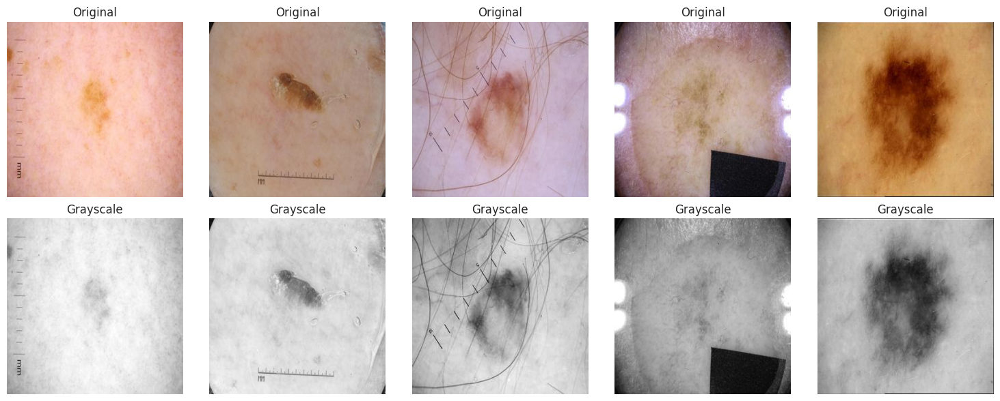

In [39]:
# Define paths for benign images (original and grayscale)
benign_path = os.path.join(dataset_path, 'train', 'benign')
gray_benign_path = os.path.join(dataset_path, 'train', 'gray_benign')

# Display random comparison of original and grayscale images
display_random_comparison(benign_path, gray_benign_path, num_images=5)

## **MALIGNANT TRAIN**

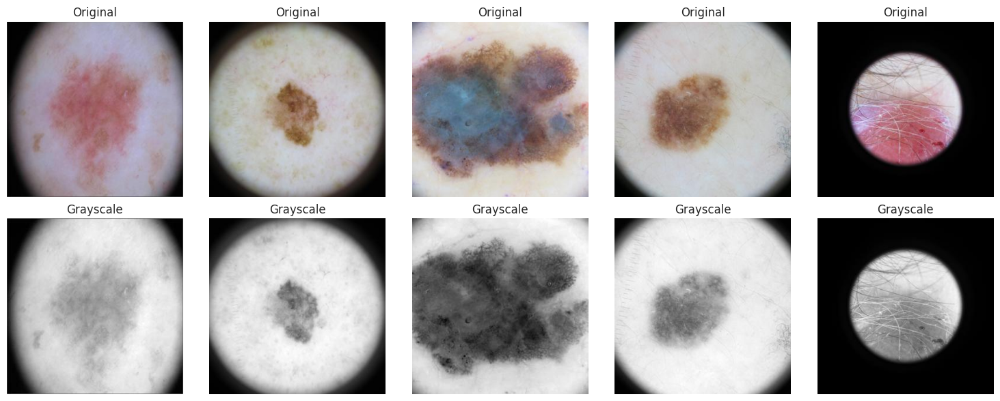

In [40]:
# Define paths for malignant images (original and grayscale)
malignant_path = os.path.join(dataset_path, 'train', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'train', 'gray_malignant')

# Display random comparison of original and grayscale images for malignant
display_random_comparison(malignant_path, gray_malignant_path, num_images=5)



---



## **Performing Grayscale on Test Data**

In [41]:
# Define paths for the source and destination directories
dataset_path = 'extracted_files/melanoma_cancer_dataset'
gray_benign_path = os.path.join(dataset_path, 'test', 'gray_benign')
gray_malignant_path = os.path.join(dataset_path, 'test', 'gray_malignant')

# Create destination directories for grayscale images
os.makedirs(gray_benign_path, exist_ok=True)
os.makedirs(gray_malignant_path, exist_ok=True)

## **Grayscaling Benign Images**

In [42]:
# Function to convert benign images to grayscale
def convert_benign_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for benign images
benign_path = os.path.join(dataset_path, 'test', 'benign')

# Convert benign images to grayscale
convert_benign_to_grayscale(benign_path, gray_benign_path)

## **Grayscaling Malignant Images**

In [43]:
# Function to convert malignant images to grayscale
def convert_malignant_to_grayscale(source_folder, dest_folder):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        if os.path.isfile(img_path):
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
                gray_img.save(os.path.join(dest_folder, img_file))  # Save in the new folder

# Define the source path for malignant images
malignant_path = os.path.join(dataset_path, 'test', 'malignant')

# Convert malignant images to grayscale
convert_malignant_to_grayscale(malignant_path, gray_malignant_path)

## **Counting number of Grayscale images Created**

In [44]:
# Function to count the number of images in a given folder
def count_images(folder_path):
    return len([img_file for img_file in os.listdir(folder_path) if img_file.endswith(('.png', '.jpg', '.jpeg'))])

# Count images in the benign and malignant original folders
benign_image_count = count_images(benign_path)
malignant_image_count = count_images(malignant_path)

# Count images in the grayscale folders
gray_benign_image_count = count_images(gray_benign_path)
gray_malignant_image_count = count_images(gray_malignant_path)

# Print the counts
print(f'Number of original benign images: {benign_image_count}')
print(f'Number of original malignant images: {malignant_image_count}')
print(f'Number of grayscale benign images: {gray_benign_image_count}')
print(f'Number of grayscale malignant images: {gray_malignant_image_count}')

Number of original benign images: 499
Number of original malignant images: 500
Number of grayscale benign images: 499
Number of grayscale malignant images: 500


# **Display Image**

## **Displaying few Grayscale Images and Comparing with Original**

In [45]:
def display_random_comparison(original_folder, gray_folder, num_images=5):
    original_images = os.listdir(original_folder)

    # Randomly select a specified number of images
    sample_images = random.sample(original_images, min(num_images, len(original_images)))
    plt.figure(figsize=(15, 6))

    for i, img_file in enumerate(sample_images):
        # Load original and grayscale images
        original_img_path = os.path.join(original_folder, img_file)
        gray_img_path = os.path.join(gray_folder, img_file)

        original_img = Image.open(original_img_path)
        gray_img = Image.open(gray_img_path)

        # Display original image
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original_img)
        plt.axis('off')  # Hide axes
        plt.title('Original')

        # Display grayscale image
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')  # Hide axes
        plt.title('Grayscale')

    plt.tight_layout()
    plt.show()

## **BENIGN TEST**

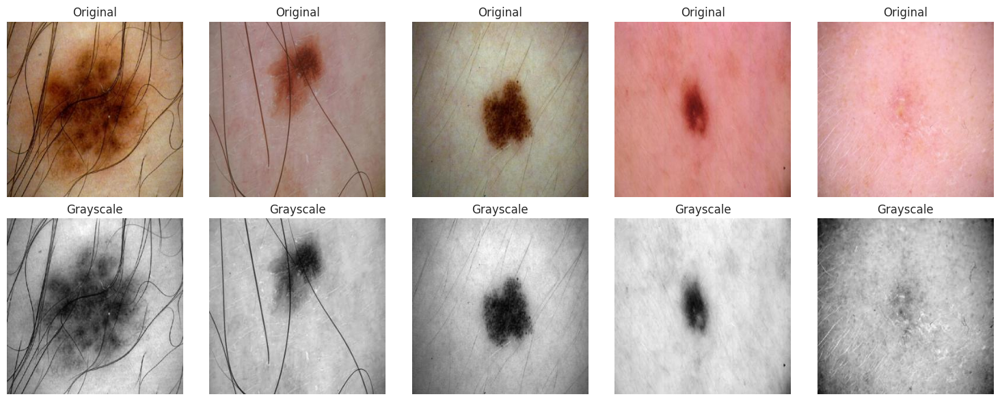

In [46]:
# Define paths for benign images (original and grayscale)
benign_path = os.path.join(dataset_path, 'test', 'benign')
gray_benign_path = os.path.join(dataset_path, 'test', 'gray_benign')

# Display random comparison of original and grayscale images
display_random_comparison(benign_path, gray_benign_path, num_images=5)

## **MALIGNANT TEST**

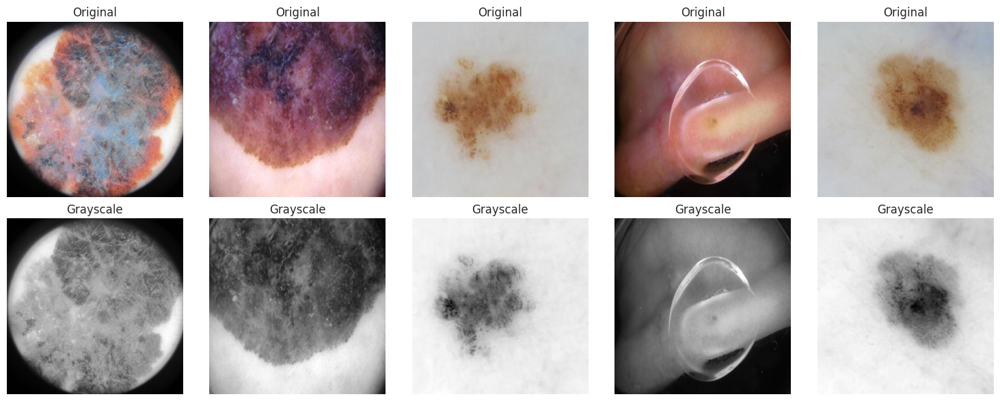

In [47]:
# Define paths for malignant images (original and grayscale)
malignant_path = os.path.join(dataset_path, 'test', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'test', 'gray_malignant')

# Display random comparison of original and grayscale images for malignant
display_random_comparison(malignant_path, gray_malignant_path, num_images=5)



---



# **Normalization of Data**

Normalization scales pixel values between 0 and 1, which helps stabilize neural network training and improves convergence.

## **Normalization (Color and Gray) On TRAIN data**

In [48]:
# Function to normalize an image to [0, 1]
def normalize_image(image):
    img_array = np.array(image).astype('float32') / 255.0  # Normalize pixel values to [0, 1]
    return img_array

# Normalize and save both color and grayscale images
def normalize_and_save_images(input_folder, output_folder_color, output_folder_gray):
    os.makedirs(output_folder_color, exist_ok=True)  # Create output folder for color images
    os.makedirs(output_folder_gray, exist_ok=True)    # Create output folder for grayscale images

    for img_file in os.listdir(input_folder):
        if img_file.endswith(('.jpg', '.png')):  # Check for image file types
            try:
                img_path = os.path.join(input_folder, img_file)
                image = Image.open(img_path).convert('RGB')  # Ensure the image is in RGB format

                # Normalize and save color image
                normalized_color = normalize_image(image)
                Image.fromarray((normalized_color * 255).astype('uint8')).save(os.path.join(output_folder_color, img_file))

                # Convert to grayscale, normalize, and save
                gray_image = image.convert('L')  # Convert to grayscale
                normalized_gray = normalize_image(gray_image)
                Image.fromarray((normalized_gray * 255).astype('uint8')).save(os.path.join(output_folder_gray, img_file))

            except Exception as e:
                print(f"Error processing {img_file}: {e}")
# Define paths for saving normalized images inside 'train' directory

dataset_path = 'extracted_files/melanoma_cancer_dataset'  # Ensure this path is correct
train_benign_path = os.path.join(dataset_path, 'train', 'benign')
train_malignant_path = os.path.join(dataset_path, 'train', 'malignant')


output_path_color_benign = os.path.join(dataset_path, 'train', 'normalized_color', 'benign')
output_path_color_malignant = os.path.join(dataset_path, 'train', 'normalized_color', 'malignant')
output_path_gray_benign = os.path.join(dataset_path, 'train', 'normalized_gray', 'benign')
output_path_gray_malignant = os.path.join(dataset_path, 'train', 'normalized_gray', 'malignant')

# Apply normalization to benign and malignant folders
normalize_and_save_images(train_benign_path, output_path_color_benign, output_path_gray_benign)
normalize_and_save_images(train_malignant_path, output_path_color_malignant, output_path_gray_malignant)

print("Normalization and saving completed.")

Normalization and saving completed.


### **Counting the number of images after Normalization**


In [49]:
# Count normalized color images
num_normalized_color_benign = len(os.listdir(output_path_color_benign))
num_normalized_color_malignant = len(os.listdir(output_path_color_malignant))

# Count normalized grayscale images
num_normalized_gray_benign = len(os.listdir(output_path_gray_benign))
num_normalized_gray_malignant = len(os.listdir(output_path_gray_malignant))

print(f"Number of normalized color benign images: {num_normalized_color_benign}")
print(f"Number of normalized color malignant images: {num_normalized_color_malignant}")
print(f"Number of normalized grayscale benign images: {num_normalized_gray_benign}")
print(f"Number of normalized grayscale malignant images: {num_normalized_gray_malignant}")

Number of normalized color benign images: 4992
Number of normalized color malignant images: 4587
Number of normalized grayscale benign images: 4992
Number of normalized grayscale malignant images: 4587


## **Displaying few Normalized Images (TRAIN)**

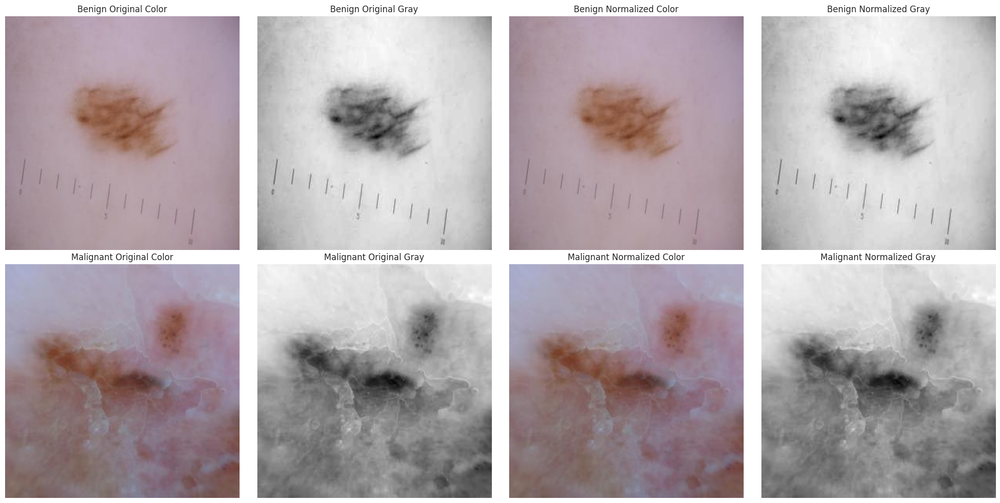

In [50]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'
paths = {
    'benign': {
        'original': os.path.join(dataset_path, 'train', 'benign'),
        'color': os.path.join(dataset_path, "train", "normalized_color", "benign"),
        'gray': os.path.join(dataset_path, "train", "normalized_gray", "benign")
    },
    'malignant': {
        'original': os.path.join(dataset_path, 'train', 'malignant'),
        'color': os.path.join(dataset_path, "train", "normalized_color", "malignant"),
        'gray': os.path.join(dataset_path, "train", "normalized_gray", "malignant")
    }
}

# Function to display all variations of randomly chosen images
def display_random_images(num_images):
    images = [(img, 'benign') for img in os.listdir(paths['benign']['original'])] + \
             [(img, 'malignant') for img in os.listdir(paths['malignant']['original'])]
    selected_images = random.sample(images, num_images)

    fig, axs = plt.subplots(len(selected_images), 4, figsize=(20, 5 * len(selected_images)))
    variation_titles = ["Original Color", "Original Gray", "Normalized Color", "Normalized Gray"]

    for idx, (image_name, category) in enumerate(selected_images):
        # Define paths for each variation
        image_paths = [
            os.path.join(paths[category]['original'], image_name),  # Original color (color image)
            os.path.join(paths[category]['original'], image_name),  # Original gray (grayscale version, same image)
            os.path.join(paths[category]['color'], image_name),    # Normalized color image
            os.path.join(paths[category]['gray'], image_name)      # Normalized gray image
        ]

        # Display each image variation
        for i, img_path in enumerate(image_paths):
            if os.path.exists(img_path):  # Check if the image file exists
                img = Image.open(img_path).convert('L' if "Gray" in variation_titles[i] else 'RGB')
                axs[idx, i].imshow(img, cmap='gray' if "Gray" in variation_titles[i] else None)
                axs[idx, i].set_title(f"{category.capitalize()} {variation_titles[i]}")
            else:
                axs[idx, i].axis('off')
                axs[idx, i].set_title(f"Missing: {variation_titles[i]}")

            axs[idx, i].axis('off')  # Hide axis for cleaner display

    plt.tight_layout()
    plt.show()

# Display images
display_random_images(num_images=2)

## **Normalization (Color and Gray) On TEST data**

In [51]:
# Function to normalize an image to [0, 1]
def normalize_image(image):
    img_array = np.array(image).astype('float32') / 255.0  # Normalize pixel values to [0, 1]
    return img_array

# Normalize and save both color and grayscale images
def normalize_and_save_images(input_folder, output_folder_color, output_folder_gray):
    os.makedirs(output_folder_color, exist_ok=True)  # Create output folder for color images
    os.makedirs(output_folder_gray, exist_ok=True)    # Create output folder for grayscale images

    for img_file in os.listdir(input_folder):
        if img_file.endswith(('.jpg', '.png')):  # Check for image file types
            try:
                img_path = os.path.join(input_folder, img_file)
                image = Image.open(img_path).convert('RGB')  # Ensure the image is in RGB format

                # Normalize and save color image
                normalized_color = normalize_image(image)
                Image.fromarray((normalized_color * 255).astype('uint8')).save(os.path.join(output_folder_color, img_file))

                # Convert to grayscale, normalize, and save
                gray_image = image.convert('L')  # Convert to grayscale
                normalized_gray = normalize_image(gray_image)
                Image.fromarray((normalized_gray * 255).astype('uint8')).save(os.path.join(output_folder_gray, img_file))

            except Exception as e:
                print(f"Error processing {img_file}: {e}")

# Define paths for saving normalized images inside 'test' directory
dataset_path = 'extracted_files/melanoma_cancer_dataset'  # Ensure this path is correct
test_benign_path = os.path.join(dataset_path, 'test', 'benign')
test_malignant_path = os.path.join(dataset_path, 'test', 'malignant')

output_path_color_benign = os.path.join(dataset_path, 'test', 'normalized_color', 'benign')
output_path_color_malignant = os.path.join(dataset_path, 'test', 'normalized_color', 'malignant')
output_path_gray_benign = os.path.join(dataset_path, 'test', 'normalized_gray', 'benign')
output_path_gray_malignant = os.path.join(dataset_path, 'test', 'normalized_gray', 'malignant')

# Apply normalization to benign and malignant folders in test dataset
normalize_and_save_images(test_benign_path, output_path_color_benign, output_path_gray_benign)
normalize_and_save_images(test_malignant_path, output_path_color_malignant, output_path_gray_malignant)

print("Normalization and saving completed for test dataset.")

Normalization and saving completed for test dataset.


### **Counting the number of images after Normalization**

In [52]:
# Count normalized color images for test dataset
num_normalized_color_benign_test = len(os.listdir(output_path_color_benign))
num_normalized_color_malignant_test = len(os.listdir(output_path_color_malignant))

# Count normalized grayscale images for test dataset
num_normalized_gray_benign_test = len(os.listdir(output_path_gray_benign))
num_normalized_gray_malignant_test = len(os.listdir(output_path_gray_malignant))

print(f"Number of normalized color benign images in test dataset: {num_normalized_color_benign_test}")
print(f"Number of normalized color malignant images in test dataset: {num_normalized_color_malignant_test}")
print(f"Number of normalized grayscale benign images in test dataset: {num_normalized_gray_benign_test}")
print(f"Number of normalized grayscale malignant images in test dataset: {num_normalized_gray_malignant_test}")

Number of normalized color benign images in test dataset: 499
Number of normalized color malignant images in test dataset: 500
Number of normalized grayscale benign images in test dataset: 499
Number of normalized grayscale malignant images in test dataset: 500


## **Displaying few Normalized Images (TRAIN)**

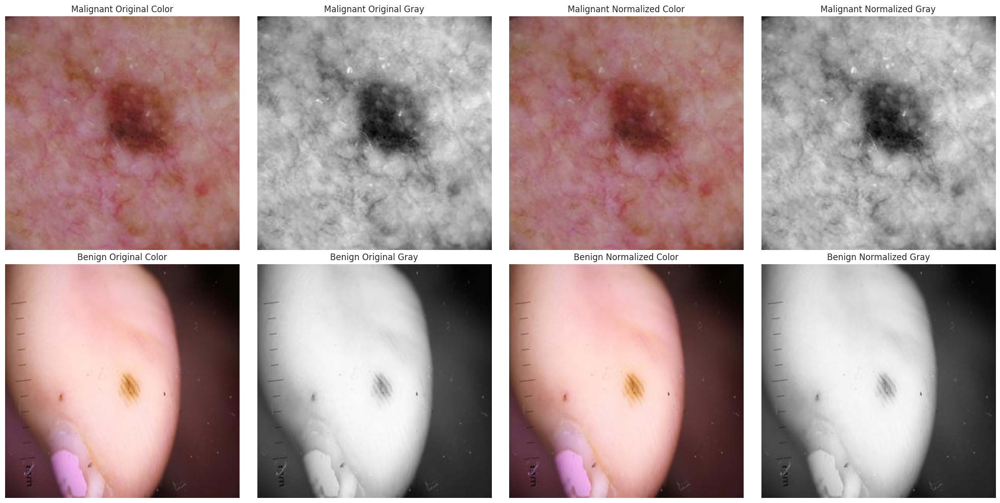

In [53]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'
paths = {
    'benign': {
        'original': os.path.join(dataset_path, 'test', 'benign'),  # Changed 'train' to 'test'
        'color': os.path.join(dataset_path, "test", "normalized_color", "benign"),  # Changed 'train' to 'test'
        'gray': os.path.join(dataset_path, "test", "normalized_gray", "benign")  # Changed 'train' to 'test'
    },
    'malignant': {
        'original': os.path.join(dataset_path, 'test', 'malignant'),  # Changed 'train' to 'test'
        'color': os.path.join(dataset_path, "test", "normalized_color", "malignant"),  # Changed 'train' to 'test'
        'gray': os.path.join(dataset_path, "test", "normalized_gray", "malignant")  # Changed 'train' to 'test'
    }
}

# Function to display all variations of randomly chosen images
def display_random_images(num_images):
    images = [(img, 'benign') for img in os.listdir(paths['benign']['original'])] + \
             [(img, 'malignant') for img in os.listdir(paths['malignant']['original'])]
    selected_images = random.sample(images, num_images)

    fig, axs = plt.subplots(len(selected_images), 4, figsize=(20, 5 * len(selected_images)))
    variation_titles = ["Original Color", "Original Gray", "Normalized Color", "Normalized Gray"]

    for idx, (image_name, category) in enumerate(selected_images):
        # Define paths for each variation
        image_paths = [
            os.path.join(paths[category]['original'], image_name),  # Original color (color image)
            os.path.join(paths[category]['original'], image_name),  # Original gray (grayscale version, same image)
            os.path.join(paths[category]['color'], image_name),    # Normalized color image
            os.path.join(paths[category]['gray'], image_name)      # Normalized gray image
        ]

        # Display each image variation
        for i, img_path in enumerate(image_paths):
            if os.path.exists(img_path):  # Check if the image file exists
                img = Image.open(img_path).convert('L' if "Gray" in variation_titles[i] else 'RGB')
                axs[idx, i].imshow(img, cmap='gray' if "Gray" in variation_titles[i] else None)
                axs[idx, i].set_title(f"{category.capitalize()} {variation_titles[i]}")
            else:
                axs[idx, i].axis('off')
                axs[idx, i].set_title(f"Missing: {variation_titles[i]}")

            axs[idx, i].axis('off')  # Hide axis for cleaner display

    plt.tight_layout()
    plt.show()

# Display images
display_random_images(num_images=2)



---



# **Data Augmentation**



## **Data Augmentation TRAIN**

In [54]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'train', 'benign')
gray_benign_path = os.path.join(dataset_path, 'train', 'gray_benign')
augmented_benign_path = os.path.join(dataset_path, 'train', 'augmented_benign')

color_malignant_path = os.path.join(dataset_path, 'train', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'train', 'gray_malignant')
augmented_malignant_path = os.path.join(dataset_path, 'train', 'augmented_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_benign_path, exist_ok=True)
os.makedirs(augmented_malignant_path, exist_ok=True)

In [55]:
# Set up augmentation configurations
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            img_array = img_array.reshape((1,) + img_array.shape + (1,))  # Add channels dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].reshape(batch[0].shape[:-1]).astype('uint8'))

                # Get augmentation type (from the configuration) and add it to the filename
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break

In [56]:
augment_images(gray_benign_path, augmented_benign_path)
augment_images(gray_malignant_path, augmented_malignant_path)

## **Displaying few Augmented Images**

In [57]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, gray_path, aug_path in [
        (benign_files, "Benign", color_benign_path, gray_benign_path, augmented_benign_path),
        (malignant_files, "Malignant", color_malignant_path, gray_malignant_path, augmented_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 2 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display grayscale image
            gray_img = Image.open(os.path.join(gray_path, file))
            axes[1].imshow(gray_img, cmap='gray')
            axes[1].set_title(f"{label} - Grayscale", fontsize=font_size)  # Set font size
            axes[1].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 2].imshow(aug_img, cmap='gray')
                axes[idx + 2].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 2].axis("off")

            plt.show()

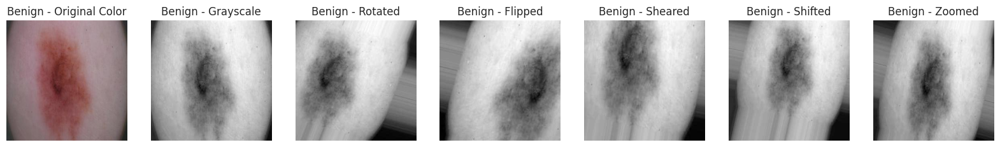

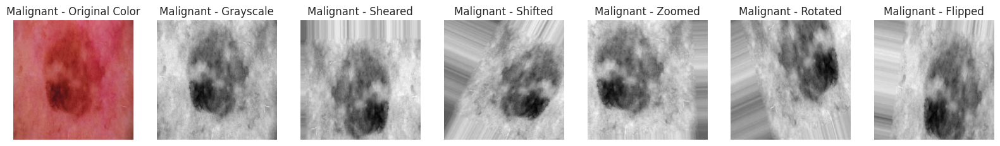

In [58]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

## **Data Augmentation TEST**

In [59]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'

# Paths for benign and malignant test images
color_benign_path = os.path.join(dataset_path, 'test', 'benign')
gray_benign_path = os.path.join(dataset_path, 'test', 'gray_benign')
augmented_benign_path = os.path.join(dataset_path, 'test', 'augmented_benign')

color_malignant_path = os.path.join(dataset_path, 'test', 'malignant')
gray_malignant_path = os.path.join(dataset_path, 'test', 'gray_malignant')
augmented_malignant_path = os.path.join(dataset_path, 'test', 'augmented_malignant')

# Ensure directories exist for augmented images in the test dataset
os.makedirs(augmented_benign_path, exist_ok=True)
os.makedirs(augmented_malignant_path, exist_ok=True)

In [60]:
# Set up augmentation configurations
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            img_array = img_array.reshape((1,) + img_array.shape + (1,))  # Add channels dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].reshape(batch[0].shape[:-1]).astype('uint8'))

                # Get augmentation type (from the configuration) and add it to the filename
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break

In [61]:
augment_images(gray_benign_path, augmented_benign_path)
augment_images(gray_malignant_path, augmented_malignant_path)

## **Displaying few Augmented Images**

In [62]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, gray_path, aug_path in [
        (benign_files, "Benign", color_benign_path, gray_benign_path, augmented_benign_path),
        (malignant_files, "Malignant", color_malignant_path, gray_malignant_path, augmented_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 2 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display grayscale image
            gray_img = Image.open(os.path.join(gray_path, file))
            axes[1].imshow(gray_img, cmap='gray')
            axes[1].set_title(f"{label} - Grayscale", fontsize=font_size)  # Set font size
            axes[1].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 2].imshow(aug_img, cmap='gray')
                axes[idx + 2].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 2].axis("off")

            plt.show()

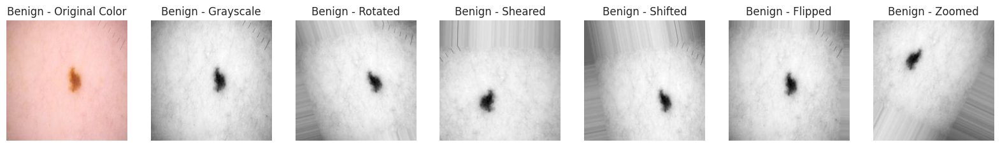

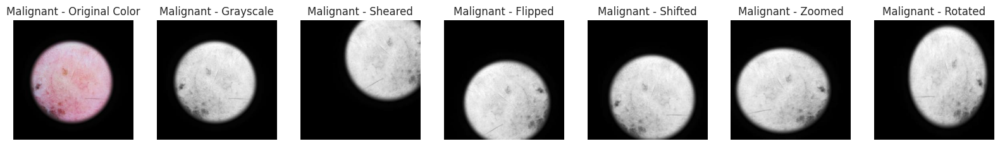

In [63]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

# **RGB Augmentation**

## **Augmentation on RGB train dataset**

In [64]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'train', 'benign')
augmented_rgb_benign_path = os.path.join(dataset_path, 'train', 'augmented_rgb_benign')

color_malignant_path = os.path.join(dataset_path, 'train', 'malignant')
augmented_rgb_malignant_path = os.path.join(dataset_path, 'train', 'augmented_rgb_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_rgb_benign_path, exist_ok=True)
os.makedirs(augmented_rgb_malignant_path, exist_ok=True)

In [65]:
# Set up augmentation configurations for RGB images
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images_rgb(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            if img_array.ndim == 2:  # Convert grayscale to RGB if needed
                img_array = np.stack([img_array] * 3, axis=-1)
            img_array = img_array.reshape((1,) + img_array.shape)  # Add batch dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].astype('uint8'))

                # Generate augmented filenames
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break


In [66]:
augment_images_rgb(color_benign_path, augmented_rgb_benign_path)
augment_images_rgb(color_malignant_path, augmented_rgb_malignant_path)

## **Displaying few Augmented Images(RGB Traindata)**

In [67]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, aug_path in [
        (benign_files, "Benign", color_benign_path, augmented_rgb_benign_path),
        (malignant_files, "Malignant", color_malignant_path, augmented_rgb_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 1 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 1].imshow(aug_img)
                axes[idx + 1].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 1].axis("off")

            plt.show()

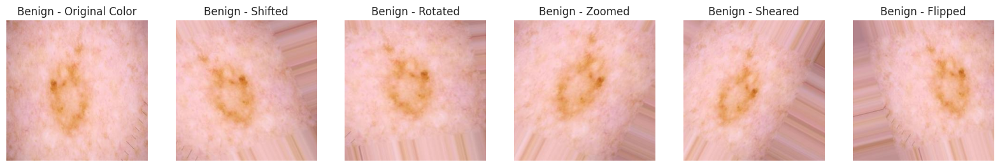

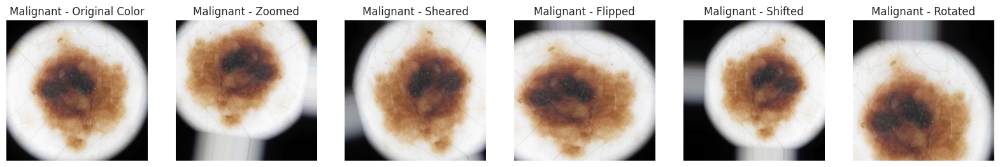

In [68]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

## **Augmentation on RGB test dataset**

In [69]:
# Define dataset paths
dataset_path = 'extracted_files/melanoma_cancer_dataset'
color_benign_path = os.path.join(dataset_path, 'test', 'benign')
augmented_rgb_benign_path = os.path.join(dataset_path, 'test', 'augmented_rgb_benign')

color_malignant_path = os.path.join(dataset_path, 'test', 'malignant')
augmented_rgb_malignant_path = os.path.join(dataset_path, 'test', 'augmented_rgb_malignant')

# Ensure directories exist for augmented images
os.makedirs(augmented_rgb_benign_path, exist_ok=True)
os.makedirs(augmented_rgb_malignant_path, exist_ok=True)

In [70]:
# Set up augmentation configurations for RGB images
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

def augment_images_rgb(source_folder, dest_folder, num_augmented_images=5):
    for img_file in os.listdir(source_folder):
        img_path = os.path.join(source_folder, img_file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            if img_array.ndim == 2:  # Convert grayscale to RGB if needed
                img_array = np.stack([img_array] * 3, axis=-1)
            img_array = img_array.reshape((1,) + img_array.shape)  # Add batch dimension

            for i, batch in enumerate(datagen.flow(img_array, batch_size=1)):
                aug_img = Image.fromarray(batch[0].astype('uint8'))

                # Generate augmented filenames
                if i == 0:
                    aug_type = "Flipped"
                elif i == 1:
                    aug_type = "Rotated"
                elif i == 2:
                    aug_type = "Shifted"
                elif i == 3:
                    aug_type = "Zoomed"
                else:
                    aug_type = "Sheared"

                aug_img.save(os.path.join(dest_folder, f'aug_{aug_type}_{i}_{img_file}'))
                if i >= num_augmented_images - 1:
                    break

In [71]:
augment_images_rgb(color_benign_path, augmented_rgb_benign_path)
augment_images_rgb(color_malignant_path, augmented_rgb_malignant_path)

## **Displaying few Augmented Images (RGB Testdata)**

In [72]:
def display_random_images_with_labels(num_images=3, num_augmented=5, font_size=10):
    benign_files = random.sample(os.listdir(color_benign_path), num_images)
    malignant_files = random.sample(os.listdir(color_malignant_path), num_images)

    for files, label, color_path, aug_path in [
        (benign_files, "Benign", color_benign_path, augmented_rgb_benign_path),
        (malignant_files, "Malignant", color_malignant_path, augmented_rgb_malignant_path)
    ]:
        for file in files:
            fig, axes = plt.subplots(1, 1 + num_augmented, figsize=(20, 4))

            # Display color image
            color_img = Image.open(os.path.join(color_path, file))
            axes[0].imshow(color_img)
            axes[0].set_title(f"{label} - Original Color", fontsize=font_size)  # Set font size
            axes[0].axis("off")

            # Display augmented images with labels indicating augmentation type
            aug_files = [f for f in os.listdir(aug_path) if file in f][:num_augmented]
            for idx, aug_file in enumerate(aug_files):
                aug_img = Image.open(os.path.join(aug_path, aug_file))
                aug_type = aug_file.split('_')[1]  # Extract the augmentation type from the filename
                axes[idx + 1].imshow(aug_img)
                axes[idx + 1].set_title(f"{label} - {aug_type}", fontsize=font_size)  # Set font size
                axes[idx + 1].axis("off")

            plt.show()

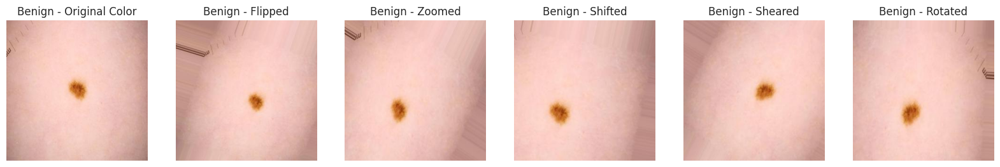

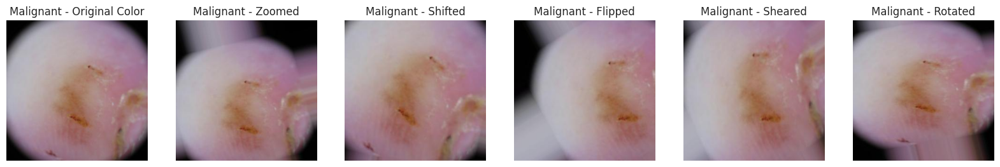

In [73]:
display_random_images_with_labels(num_images=1, num_augmented=5, font_size=12)

## **Total Augmented Images (Gray and RGB)**

###**Five augmented images created per images for TRAIN and TEST dataset**

In [74]:
# Function to count images in a directory
def count_images(folder_path):
    # Count total images in the directory (both .jpg and .png)
    total_images = len([f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')])
    return total_images

# Define the dataset path
dataset_path = 'extracted_files/melanoma_cancer_dataset'

# Paths for the original directories (train and test)
train_benign_path = os.path.join(dataset_path, 'train', 'benign')
train_malignant_path = os.path.join(dataset_path, 'train', 'malignant')
test_benign_path = os.path.join(dataset_path, 'test', 'benign')
test_malignant_path = os.path.join(dataset_path, 'test', 'malignant')

# Paths for the gray and RGB augmented images (train and test)
augmented_train_gray_benign_path = os.path.join(dataset_path, 'train', 'augmented_benign')
augmented_train_gray_malignant_path = os.path.join(dataset_path, 'train', 'augmented_malignant')
augmented_train_rgb_benign_path = os.path.join(dataset_path, 'train', 'augmented_rgb_benign')
augmented_train_rgb_malignant_path = os.path.join(dataset_path, 'train', 'augmented_rgb_malignant')

augmented_test_gray_benign_path = os.path.join(dataset_path, 'test', 'augmented_benign')
augmented_test_gray_malignant_path = os.path.join(dataset_path, 'test', 'augmented_malignant')
augmented_test_rgb_benign_path = os.path.join(dataset_path, 'test', 'augmented_rgb_benign')
augmented_test_rgb_malignant_path = os.path.join(dataset_path, 'test', 'augmented_rgb_malignant')

# Collect data for original and augmented image counts (both train and test datasets)
data = [
    ('train_benign', count_images(train_benign_path), count_images(augmented_train_gray_benign_path), count_images(augmented_train_rgb_benign_path)),
    ('train_malignant', count_images(train_malignant_path), count_images(augmented_train_gray_malignant_path), count_images(augmented_train_rgb_malignant_path)),
    ('test_benign', count_images(test_benign_path), count_images(augmented_test_gray_benign_path), count_images(augmented_test_rgb_benign_path)),
    ('test_malignant', count_images(test_malignant_path), count_images(augmented_test_gray_malignant_path), count_images(augmented_test_rgb_malignant_path)),
]

# Create a DataFrame with counts for original, gray augmented, and RGB augmented images
df = pd.DataFrame(data, columns=['Category', 'Original Image Count', 'Gray Augmented Count', 'RGB Augmented Count'])

In [75]:
df

,Category,Original Image Count,Gray Augmented Count,RGB Augmented Count
0,train_benign,4992,24960,24960
1,train_malignant,4587,22935,22935
2,test_benign,499,2495,2495
3,test_malignant,500,2500,2500




---



---



# **Basic CNN Model**

## **(1) Raw Dataset (without duplicates)**

**Define Paths and Parameters, Model parameters,Data generators with augmentation for train and basic rescaling for test**

In [76]:
# Define paths to train and test directories
train_dir = 'extracted_files/melanoma_cancer_dataset/train'
test_dir = 'extracted_files/melanoma_cancer_dataset/test'

# Model parameters
img_height, img_width = 128, 128
batch_size = 32
epochs = 10

# Data generators with augmentation for train and basic rescaling for test
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    classes=['benign', 'malignant']
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False,
    classes=['benign', 'malignant']
)

Found 9579 images belonging to 2 classes.
Found 999 images belonging to 2 classes.


## **Build the CNN Model**

In [77]:
# Initialize a Sequential model
model1 = Sequential([
    Input(shape=(img_height, img_width, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])


## **Compile the Model**

In [78]:
model1.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

## **Train the Model**

In [80]:
history1 = model1.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 172ms/step - accuracy: 0.7633 - loss: 0.4832 - val_accuracy: 0.8749 - val_loss: 0.2880
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - accuracy: 0.8525 - loss: 0.3502 - val_accuracy: 0.8929 - val_loss: 0.2774
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - accuracy: 0.8528 - loss: 0.3598 - val_accuracy: 0.8959 - val_loss: 0.2664
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 85s 169ms/step - accuracy: 0.8739 - loss: 0.3165 - val_accuracy: 0.8889 - val_loss: 0.2764
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 80s 162ms/step - accuracy: 0.8639 - loss: 0.3189 - val_accuracy: 0.8929 - val_loss: 0.2733
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - accuracy: 0.8738 - loss: 0.3128 - val_accuracy: 0.8999 - val_loss: 0.2565
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 82s 158ms/step - accuracy: 0.8776 - loss: 0.3075 - val_accuracy: 0.8969 - val_loss: 0.2687
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 81s 156ms/step - accuracy: 0.8773 - loss: 0

## **Accuracy Report**

In [81]:
test_loss, test_accuracy = model1.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.9206 - loss: 0.2326
Test Loss: 0.2593042552471161
Test Accuracy: 0.8998998999595642


>>**Model Accuracy:** This measures how often the model’s predictions are correct. Higher accuracy means the model is making more accurate predictions.

>>**Model Loss:** This measures how far the model's predictions are from the actual values. Lower loss means the model is making predictions that are closer to the correct values. Loss is used during training to help the model improve by minimizing errors.

---



## **Classification Report**

In [82]:
# Generate classification report
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Get predicted probabilities from the model
predicted_probs = model1.predict(test_generator)

# Convert probabilities to class labels (0 or 1) using a threshold of 0.5
predicted_labels = (predicted_probs > 0.5).astype(int)

# Print classification report
print("\nClassification Report:\n")
print(classification_report(true_labels, predicted_labels, target_names=class_names))

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step

Classification Report:

              precision    recall  f1-score   support

      benign       0.87      0.94      0.90       499
   malignant       0.93      0.86      0.90       500

    accuracy                           0.90       999
   macro avg       0.90      0.90      0.90       999
weighted avg       0.90      0.90      0.90       999



## **Accuracy and Loss Curve**

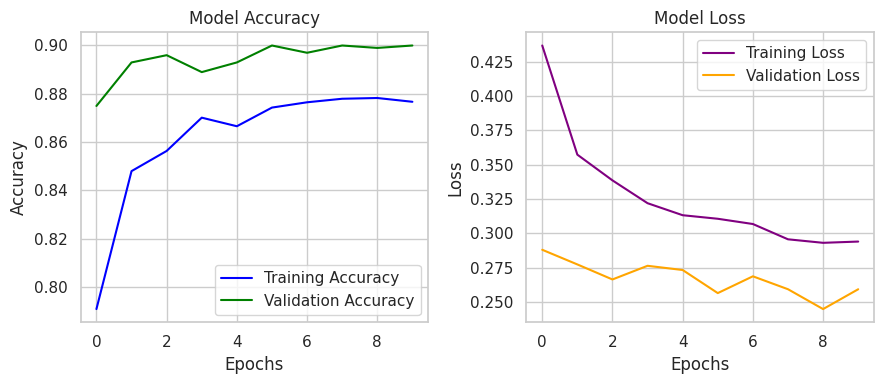

In [83]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history1.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history1.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history1.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history1.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

### **Insight**

####**Model Accuracy**

>***Training Accuracy (blue line):*** This metric indicates how well the model is learning on the training dataset. The blue line shows a steady increase, which suggests that the model is learning the patterns in the training data over time.

>***Validation Accuracy (green line):*** This line represents the model's performance on the validation dataset, which helps evaluate how well it generalizes to unseen data.

>>The validation accuracy generally follows the training accuracy but fluctuates slightly towards the end. This fluctuation might indicate that the model is starting to overfit, as it's learning the training data well but struggles to generalize to new data.

####**Model Loss**

>***Training Loss (purple line):*** The loss for the training data is decreasing steadily, suggesting that the model is improving its fit to the training data over time.

>***Validation Loss (orange line):*** Initially, the validation loss also decreases, but after a few epochs, it plateaus and even starts to fluctuate without significant improvement.

>>This pattern (where training loss decreases but validation loss stabilizes or increases) is a sign of potential overfitting. The model might be fitting too closely to the training data and not generalizing as effectively to new data.

---



## **ROC and AUC Curve**

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step


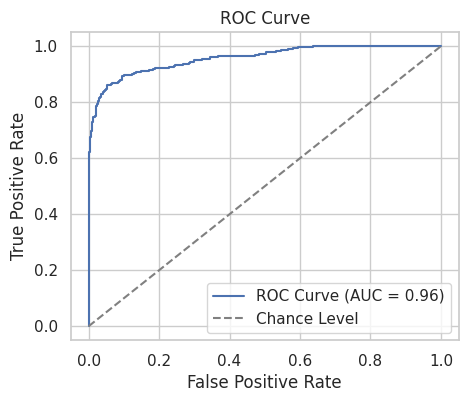

In [84]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Get predicted probabilities from the model
predicted_probs = model1.predict(test_generator)

# Calculate ROC-AUC
roc_auc = roc_auc_score(true_labels, predicted_probs)

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)

# Plot the ROC curve
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance Level')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()


## **Confusion Matrix**

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step


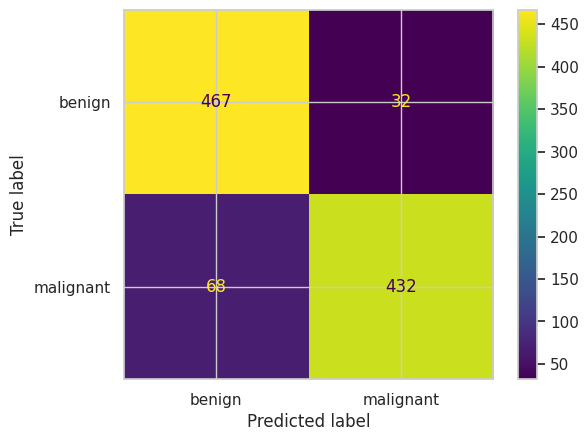

In [85]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_true = test_generator.classes
y_pred = model1.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

### **Insight**

**The heatmap here is a confusion matrix visualization, which shows the classification results for benign and malignant melanoma images. Each cell displays the number of images for which the model's predictions matched or mismatched the true labels.**

**Correct Predictions:** These are correctly identified images for each class. The model successfully labeled 271 benign and 233 malignant cases, showing some ability to distinguish between classes.

**Misclassifications:** The confusion matrix reveals that 267 malignant cases were classified as benign, and 228 benign cases were classified as malignant.

***This suggests that the model struggles to distinguish between benign and malignant images, with significant misclassification in both categories.***

In [86]:
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,914,309 (37.82 MB)

 Trainable params: 3,304,769 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,609,540 (25.21 MB)

## **Save model 1**

In [87]:
# Save Model 1
model1.save('model1.h5')

# **(2) Gray Scale and Normalized**

**Define Paths and Parameters, Model parameters,Data generators with augmentation for train and basic rescaling for test**

In [88]:
# Define paths to train and test directories
train_dir = 'extracted_files/melanoma_cancer_dataset/train'
test_dir = 'extracted_files/melanoma_cancer_dataset/test'

# Model parameters
img_height, img_width = 128, 128
batch_size = 32
epochs = 10

In [89]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['gray_benign', 'gray_malignant']
)

print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['gray_benign', 'gray_malignant'],
    shuffle=False  # Necessary for accurate evaluation metrics
)

print("Test Generator Class Indices: ", test_generator.class_indices)


Found 9579 images belonging to 2 classes.
Train Generator Class Indices:  {'gray_benign': 0, 'gray_malignant': 1}
Found 999 images belonging to 2 classes.
Test Generator Class Indices:  {'gray_benign': 0, 'gray_malignant': 1}


## **Build the CNN Model**

In [90]:
# Initialize a Sequential model
model2 = Sequential([
    Input(shape=(img_height, img_width, 1)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification (sigmoid)
])

model2.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

## **Train the Model**

In [91]:
history2 = model2.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - accuracy: 0.7079 - loss: 0.5321 - val_accuracy: 0.8519 - val_loss: 0.3418
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.8289 - loss: 0.3623 - val_accuracy: 0.8529 - val_loss: 0.3261
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - accuracy: 0.8338 - loss: 0.3451 - val_accuracy: 0.8759 - val_loss: 0.2773
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - accuracy: 0.8580 - loss: 0.3105 - val_accuracy: 0.8769 - val_loss: 0.3040
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - accuracy: 0.8635 - loss: 0.3092 - val_accuracy: 0.8809 - val_loss: 0.2664
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.8798 - loss: 0.2865 - val_accuracy: 0.8879 - val_loss: 0.2563
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.8824 - loss: 0.2688 - val_accuracy: 0.8879 - val_loss: 0.2521
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - accuracy: 0.8842 - loss: 0.2534 - val_accuracy: 

## **Evaluate the Model**

In [92]:
# Evaluate model on the test dataset
test_loss, test_accuracy = model2.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9053 - loss: 0.2271
Test Loss: 0.25467798113822937
Test Accuracy: 0.8848848938941956


## **Classification Report**

In [93]:
# Generate classification report
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Get predicted probabilities from the model
predicted_probs = model2.predict(test_generator)

# Convert probabilities to class labels (0 or 1) using a threshold of 0.5
predicted_labels = (predicted_probs > 0.5).astype(int)

# Print classification report
print("\nClassification Report:\n")
print(classification_report(true_labels, predicted_labels, target_names=class_names))

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

Classification Report:

                precision    recall  f1-score   support

   gray_benign       0.86      0.92      0.89       499
gray_malignant       0.91      0.85      0.88       500

      accuracy                           0.88       999
     macro avg       0.89      0.88      0.88       999
  weighted avg       0.89      0.88      0.88       999



## **ROC and AUC Curve**

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


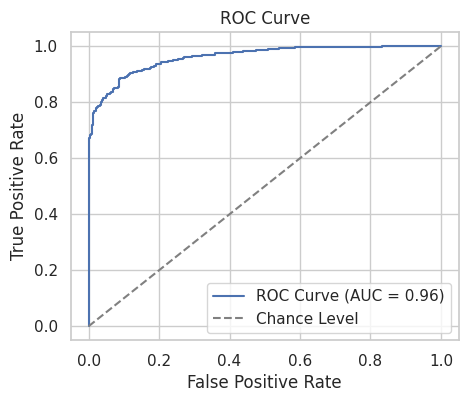

In [94]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Get predicted probabilities from the model
predicted_probs = model2.predict(test_generator)

# Calculate ROC-AUC
roc_auc = roc_auc_score(true_labels, predicted_probs)

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)

# Plot the ROC curve
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance Level')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()


## **Plot Accuracy and Loss**

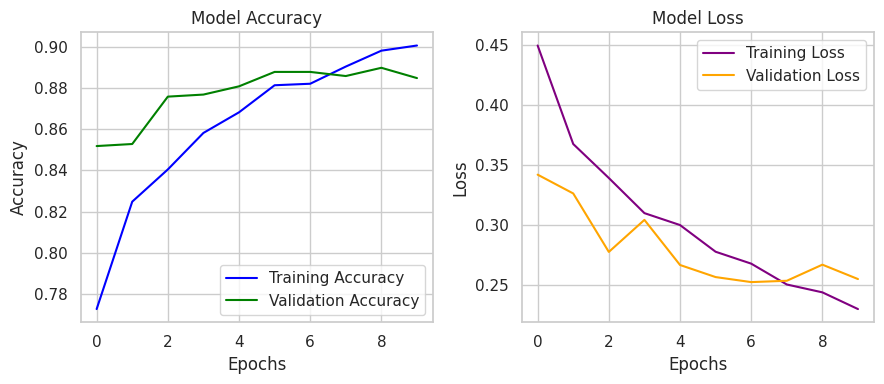

In [95]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history2.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history2.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history2.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history2.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


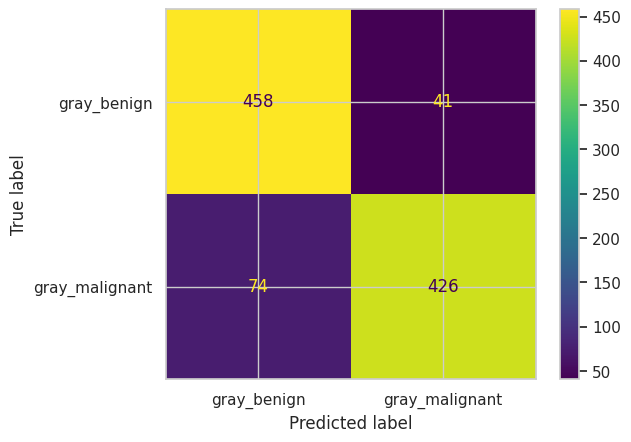

In [96]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_true = test_generator.classes
y_pred = model2.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

In [97]:
model2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,912,581 (37.81 MB)

 Trainable params: 3,304,193 (12.60 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,608,388 (25.21 MB)

## **Save Model 2**

In [98]:
# Save Model 2
model1.save('model2.h5')

# **(3) Augmented (GRAY)**

**Define Paths and Parameters, Model parameters,Data generators with augmentation for train and basic rescaling for test**

In [99]:
# Define paths to train and test directories
train_dir = 'extracted_files/melanoma_cancer_dataset/train'
test_dir = 'extracted_files/melanoma_cancer_dataset/test'

# Model parameters
img_height, img_width = 128, 128
batch_size = 32
epochs = 10

In [100]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='binary',
    classes=['augmented_benign', 'augmented_malignant']
)

print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='binary',
    classes=['augmented_benign', 'augmented_malignant'],
    shuffle=False  # To ensure consistent predictions
)

print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_benign': 0, 'augmented_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_benign': 0, 'augmented_malignant': 1}


## **Build the CNN Model**

In [101]:
# Define model
model3 = Sequential([
    Input(shape=(img_height, img_width, 1)),
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model
optimizer = Adam(learning_rate=0.0001)
model3.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)

## **Train the Model**

In [102]:
history3 = model3.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 95s 59ms/step - accuracy: 0.8050 - loss: 0.4378 - val_accuracy: 0.8160 - val_loss: 0.3990
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 60s 40ms/step - accuracy: 0.8600 - loss: 0.3216 - val_accuracy: 0.8829 - val_loss: 0.2795
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 56s 37ms/step - accuracy: 0.8726 - loss: 0.2948 - val_accuracy: 0.8488 - val_loss: 0.3925
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 79s 35ms/step - accuracy: 0.8813 - loss: 0.2750 - val_accuracy: 0.8454 - val_loss: 0.3968
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 83s 36ms/step - accuracy: 0.8863 - loss: 0.2650 - val_accuracy: 0.8521 - val_loss: 0.3286
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - accuracy: 0.8983 - loss: 0.2458 - val_accuracy: 0.8527 - val_loss: 0.3400
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 81s 31ms/step - accuracy: 0.9022 - loss: 0.2326 - val_accuracy: 0.8659 - val_loss: 0.3019
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - accuracy: 0.9099 - loss: 0.21

## **Evaluate the Model**

In [103]:
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.9415 - loss: 0.1703
Test Loss: 0.2514173984527588
Test Accuracy: 0.906706690788269


## **Classification Report**

In [104]:
# Generate classification report
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Get predicted probabilities from the model
predicted_probs = model3.predict(test_generator)

# Convert probabilities to class labels (0 or 1) using a threshold of 0.5
predicted_labels = (predicted_probs > 0.5).astype(int)

# Print classification report
print("\nClassification Report:\n")
print(classification_report(true_labels, predicted_labels, target_names=class_names))


157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

Classification Report:

                     precision    recall  f1-score   support

   augmented_benign       0.87      0.96      0.91      2495
augmented_malignant       0.95      0.86      0.90      2500

           accuracy                           0.91      4995
          macro avg       0.91      0.91      0.91      4995
       weighted avg       0.91      0.91      0.91      4995



## **ROC and AUC Curve**

157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step


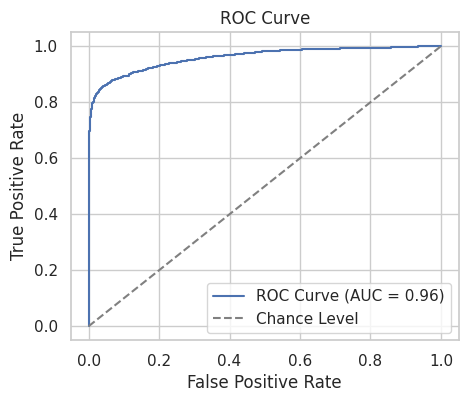

In [105]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Get predicted probabilities from the model
predicted_probs = model3.predict(test_generator)

# Calculate ROC-AUC
roc_auc = roc_auc_score(true_labels, predicted_probs)

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)

# Plot the ROC curve
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance Level')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()


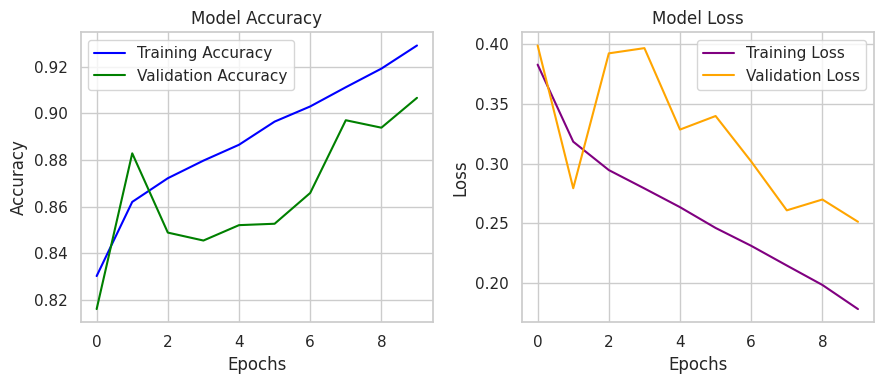

In [106]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history3.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history3.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history3.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history3.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step


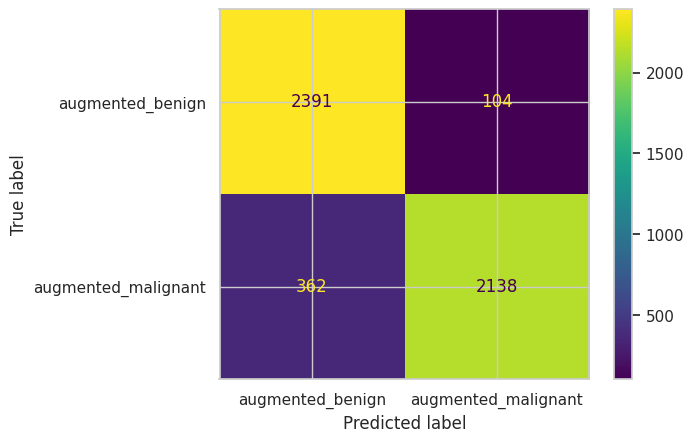

In [107]:
# Assuming 'y_true' is the true labels and 'y_pred' is the predicted labels
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_true = test_generator.classes
y_pred = model3.predict(test_generator)
y_pred = y_pred > 0.5  # Convert probabilities to binary labels

cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=test_generator.class_indices.keys()).plot()
plt.show()

In [108]:
model3.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,915,397 (37.82 MB)

 Trainable params: 3,304,897 (12.61 MB)

 Non-trainable params: 704 (2.75 KB)

 Optimizer params: 6,609,796 (25.21 MB)

## **Save Model 3**

In [109]:
# Save Model 3
model1.save('model3.h5')

# **(4) Augmented (RGB)**

**Define Paths and Parameters, Model parameters,Data generators with augmentation for train and basic rescaling for test**

In [110]:
# Define paths to train and test directories
train_dir = 'extracted_files/melanoma_cancer_dataset/train'
test_dir = 'extracted_files/melanoma_cancer_dataset/test'

# Model parameters
img_height, img_width = 128, 128
batch_size = 32
epochs = 10  # Increased epochs for better model convergence

In [111]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,  # Augmentations for better generalization
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']
)

print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant'],
    shuffle=False  # Disable shuffle for evaluation consistency
)

print("Test Generator Class Indices: ", test_generator.class_indices)


Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}


## **Build the CNN Model**

In [112]:
# Define model
model4 = Sequential([
    Input(shape=(img_height, img_width, 1)),

    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    Dense(1, activation='sigmoid')
])

# Compile the model with Adam optimizer and a reduced learning rate
optimizer = Adam(learning_rate=0.0001)
model4.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)


## **Train the Model**

In [113]:
history4 = model4.fit(
    train_generator,
    epochs=epochs,
    validation_data=test_generator
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 192s 123ms/step - accuracy: 0.8070 - loss: 0.4328 - val_accuracy: 0.8356 - val_loss: 0.4435
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 149s 91ms/step - accuracy: 0.8508 - loss: 0.3391 - val_accuracy: 0.8200 - val_loss: 0.5306
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 139s 89ms/step - accuracy: 0.8595 - loss: 0.3223 - val_accuracy: 0.8869 - val_loss: 0.3130
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 136s 90ms/step - accuracy: 0.8636 - loss: 0.3142 - val_accuracy: 0.8246 - val_loss: 0.5614
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 140s 89ms/step - accuracy: 0.8662 - loss: 0.3046 - val_accuracy: 0.8332 - val_loss: 0.3686
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 133s 89ms/step - accuracy: 0.8725 - loss: 0.2958 - val_accuracy: 0.8901 - val_loss: 0.2843
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 135s 90ms/step - accuracy: 0.8753 - loss: 0.2905 - val_accuracy: 0.8819 - val_loss: 0.2911
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 134s 89ms/step - accuracy: 0.8805 - l

## **Evaluate the Model**

In [114]:
test_loss, test_accuracy = model4.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - accuracy: 0.9437 - loss: 0.1683
Test Loss: 0.2784448564052582
Test Accuracy: 0.8980981111526489


## **Classification Report**

In [115]:
# Generate classification report
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Get predicted probabilities from the model
predicted_probs = model4.predict(test_generator)

# Convert probabilities to class labels (0 or 1) using a threshold of 0.5
predicted_labels = (predicted_probs > 0.5).astype(int)

# Print classification report
print("\nClassification Report:\n")
print(classification_report(true_labels, predicted_labels, target_names=class_names))



157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

Classification Report:

                         precision    recall  f1-score   support

   augmented_rgb_benign       0.85      0.97      0.90      2495
augmented_rgb_malignant       0.96      0.83      0.89      2500

               accuracy                           0.90      4995
              macro avg       0.91      0.90      0.90      4995
           weighted avg       0.91      0.90      0.90      4995



## **ROC and AUC Curve**

157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step


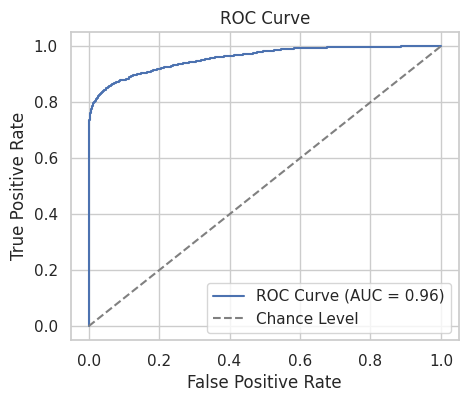

In [116]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Get predicted probabilities from the model
predicted_probs = model4.predict(test_generator)

# Calculate ROC-AUC
roc_auc = roc_auc_score(true_labels, predicted_probs)

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)

# Plot the ROC curve
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance Level')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()



## **Accuracy and Loss Curve**

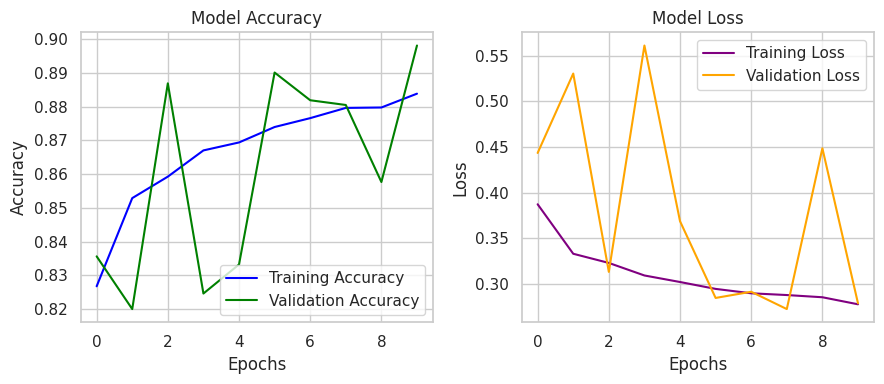

In [117]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history4.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history4.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history4.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history4.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

## **Confusion Matrix**

157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step


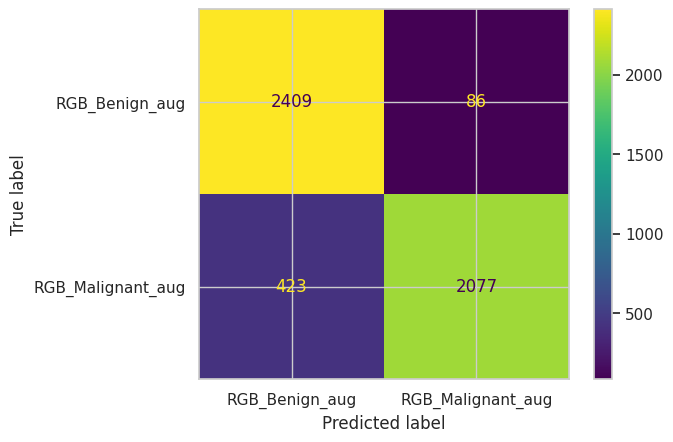

In [118]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_true = test_generator.classes
y_pred = model4.predict(test_generator) > 0.5  # Convert probabilities to binary labels
cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=['RGB_Benign_aug', 'RGB_Malignant_aug']).plot()
plt.show()

In [119]:
model4.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 128, 128, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │       4,194,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,864,517 (49.07 MB)

 Trainable params: 4,287,937 (16.36 MB)

 Non-trainable params: 704 (2.75 KB)

 Optimizer params: 8,575,876 (32.71 MB)

## **Save Model 4**

In [120]:
# Save Model 4
model1.save('model4.h5')

# **VGG16 model**

##**(on the augmented RGB dataset)**

In [121]:
# Define paths to train and test directories
train_dir = '/content/extracted_files/melanoma_cancer_dataset/train/'
test_dir = '/content/extracted_files/melanoma_cancer_dataset/test/'
# Model parameters
img_height, img_width = 128, 128  # Resize images for uniform input
batch_size = 32
epochs = 10

In [122]:
# Data generators with basic rescaling
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess images from the train and test folders
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in train
print("Train Generator Class Indices: ", train_generator.class_indices)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode='rgb',  # Ensures images are loaded in grayscale
    class_mode='binary',
    classes=['augmented_rgb_benign', 'augmented_rgb_malignant']  # Ensure binary classification
)

# Print accessed directories in test
print("Test Generator Class Indices: ", test_generator.class_indices)

Found 47895 images belonging to 2 classes.
Train Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}
Found 4995 images belonging to 2 classes.
Test Generator Class Indices:  {'augmented_rgb_benign': 0, 'augmented_rgb_malignant': 1}


In [123]:
# Load pre-trained VGG16 model (excluding the top classification layer)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the VGG16 base model
model5 = Sequential([
    base_model,
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [124]:
# Compile the model
optimizer = Adam(learning_rate=0.0001)  # Use Adam optimizer with a low learning rate
model5.compile(
    loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy']
)
# Train the model
history5 = model5.fit(train_generator, epochs=epochs, validation_data=test_generator)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1497/1497 ━━━━━━━━━━━━━━━━━━━━ 144s 91ms/step - accuracy: 0.8221 - loss: 0.3884 - val_accuracy: 0.8913 - val_loss: 0.2593
Epoch 2/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 112s 75ms/step - accuracy: 0.8833 - loss: 0.2777 - val_accuracy: 0.8967 - val_loss: 0.2472
Epoch 3/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 101s 67ms/step - accuracy: 0.8937 - loss: 0.2561 - val_accuracy: 0.8947 - val_loss: 0.2569
Epoch 4/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 142s 67ms/step - accuracy: 0.8963 - loss: 0.2471 - val_accuracy: 0.8945 - val_loss: 0.2366
Epoch 5/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 143s 68ms/step - accuracy: 0.9022 - loss: 0.2370 - val_accuracy: 0.8961 - val_loss: 0.2306
Epoch 6/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 101s 68ms/step - accuracy: 0.9061 - loss: 0.2276 - val_accuracy: 0.8919 - val_loss: 0.2402
Epoch 7/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 142s 67ms/step - accuracy: 0.9104 - loss: 0.2201 - val_accuracy: 0.9007 - val_loss: 0.2395
Epoch 8/10
1497/1497 ━━━━━━━━━━━━━━━━━━━━ 141s 67ms/step - accuracy: 0.9123 - lo

## **Evaluate the model**

In [125]:
# Evaluate the model
test_loss, test_accuracy = model5.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step - accuracy: 0.9038 - loss: 0.2409
Test Loss: 0.23929491639137268
Test Accuracy: 0.9065064787864685


## **Classification report**

In [126]:
# Generate classification report
true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Get predicted probabilities from the model
predicted_probs = model5.predict(test_generator)

# Convert probabilities to class labels (0 or 1) using a threshold of 0.5
predicted_labels = (predicted_probs > 0.5).astype(int)

# Print classification report
print("\nClassification Report:\n")
print(classification_report(true_labels, predicted_labels, target_names=class_names))


157/157 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

Classification Report:

                         precision    recall  f1-score   support

   augmented_rgb_benign       0.49      0.53      0.51      2495
augmented_rgb_malignant       0.49      0.45      0.47      2500

               accuracy                           0.49      4995
              macro avg       0.49      0.49      0.49      4995
           weighted avg       0.49      0.49      0.49      4995



## **Accuracy and Loss Curve**

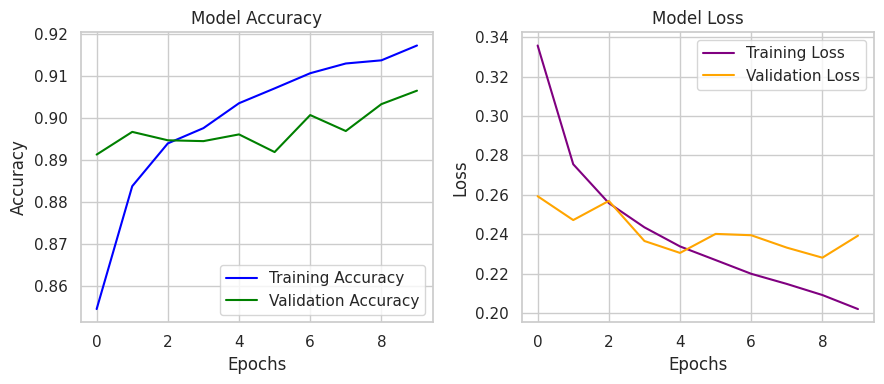

In [128]:
# Set figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))  # Adjust the figure size as needed

# Plot accuracy
ax1.plot(history5.history['accuracy'], label='Training Accuracy', color='blue')  # Change color as desired
ax1.plot(history5.history['val_accuracy'], label='Validation Accuracy', color='green')  # Change color as desired
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_title('Model Accuracy')
ax1.legend()

# Plot loss
ax2.plot(history5.history['loss'], label='Training Loss', color='purple')  # Change color as desired
ax2.plot(history5.history['val_loss'], label='Validation Loss', color='orange')  # Change color as desired
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_title('Model Loss')
ax2.legend()

# Show the plot
plt.tight_layout()  # Adjusts layout to prevent overlap
plt.show()

## **ROC and AUC Curve**

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step


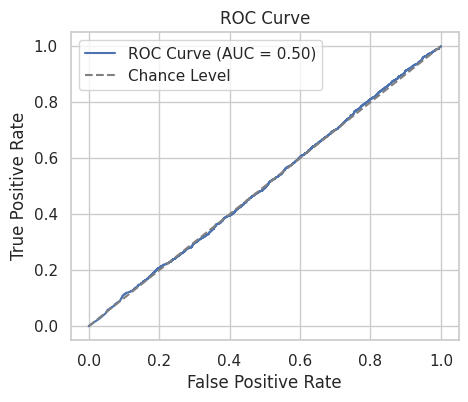

In [127]:
# Get predicted probabilities from the model
predicted_probs = model5.predict(test_generator)

# Calculate ROC-AUC
roc_auc = roc_auc_score(true_labels, predicted_probs)

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)

# Plot the ROC curve
plt.figure(figsize=(5, 4))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance Level')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

## **Confusion Matrix**

157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step


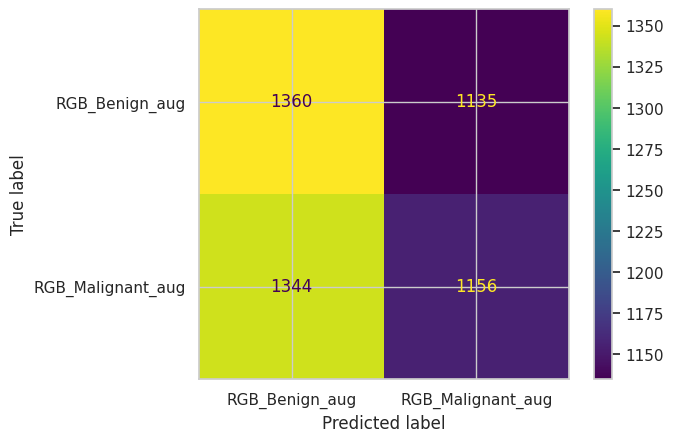

In [129]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_true = test_generator.classes
y_pred = model5.predict(test_generator) > 0.5  # Convert probabilities to binary labels
cm = confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay(cm, display_labels=['RGB_Benign_aug', 'RGB_Malignant_aug']).plot()
plt.show()


## **Save Model 5**

In [130]:
# Save Model 5
model1.save('model5.h5')

In [131]:
model5.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │       1,048,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,861,189 (68.14 MB)

 Trainable params: 1,048,833 (4.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 2,097,668 (8.00 MB)



---



---



# **Comparison table**

In [157]:
import pandas as pd

# Model names
model_names = [' CNN Model on Original data', 'CNN Model on Gray Normalized', 'CNN Model on Gray Augmented', 'CNN on RGB Augmented', 'VGG16 on RGB Augmented']

# Correctly assigned test accuracy values (these should be valid floating point numbers)
test_accuracies = [
    0.8998998999595642,  # Original data
    0.8848848938941956,  # Gray Normalized
    0.906706690788269,   # Gray Augmented
    0.8980981111526489,  # RGB Augmented
    0.9065064787864685   # VGG16
]

# Round the values to 2 decimal places and convert to percentage
test_accuracies_percentage = [round(acc * 100, 2) for acc in test_accuracies]

# Create DataFrame for comparison
comparison_df = pd.DataFrame({
    'Model': model_names,
    'Test Accuracy (Raw)': test_accuracies,
    'Test Accuracy (%)': test_accuracies_percentage
})


In [158]:
comparison_df

,Model,Test Accuracy (Raw),Test Accuracy (%)
0,CNN Model on Original data,0.899900,89.99
1,CNN Model on Gray Normalized,0.884885,88.49
2,CNN Model on Gray Augmented,0.906707,90.67
3,CNN on RGB Augmented,0.898098,89.81
4,VGG16 on RGB Augmented,0.906506,90.65


## **Accuracy and Loss Curve**

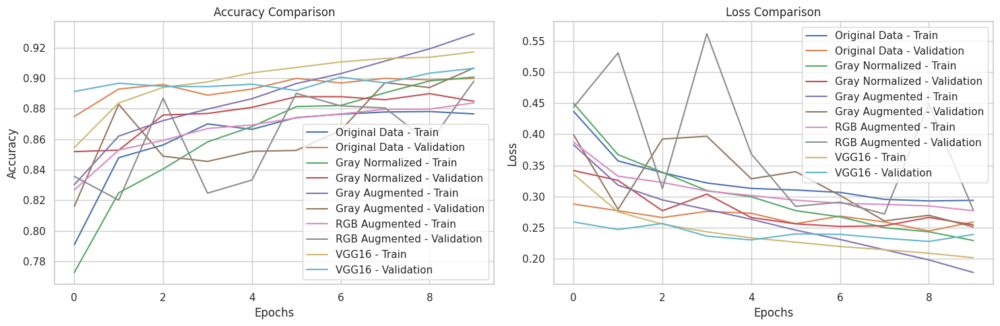

In [149]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss curves side by side
def plot_combined_accuracy_loss(histories, model_names):
    # Create a figure with 1 row and 2 columns for side-by-side plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot Accuracy in the first subplot (ax1)
    for i, (history, model_name) in enumerate(zip(histories, model_names)):
        ax1.plot(history.history['accuracy'], label=f'{model_name} - Train')
        ax1.plot(history.history['val_accuracy'], label=f'{model_name} - Validation')

    ax1.set_title('Accuracy Comparison')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    # Plot Loss in the second subplot (ax2)
    for i, (history, model_name) in enumerate(zip(histories, model_names)):
        ax2.plot(history.history['loss'], label=f'{model_name} - Train')
        ax2.plot(history.history['val_loss'], label=f'{model_name} - Validation')

    ax2.set_title('Loss Comparison')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    # Display the plots
    plt.tight_layout()  # To ensure there's no overlap between the plots
    plt.show()

# List of histories from all models
histories = [history1, history2, history3, history4, history5]  # Replace with actual history objects

# List of model names
model_names = ['Original Data', 'Gray Normalized', 'Gray Augmented', 'RGB Augmented', 'VGG16']

# Call the function to plot the combined accuracy and loss graphs
plot_combined_accuracy_loss(histories, model_names)


#**Conclusion:**
###**Based on the test accuracy results:**

**The Gray Augmented model achieved the highest test accuracy of 90.67%, making it the best performer among the models evaluated.
The VGG16 model followed closely with a test accuracy of 90.65%, showing that pre-trained models can provide a very competitive performance, especially for image classification tasks.
The Original Data and RGB Augmented models performed slightly lower, with accuracies of 89.99% and 89.81% respectively, but they still performed well, suggesting that data augmentation techniques (such as gray normalization and augmentation) contribute positively to performance.**

##**Best Performing Model**

1. **Gray Augmented**

2. **VGG16**

---



##**Why These Models Were Chosen:**
**Gray Augmented Model:** The use of grayscale images reduces the data complexity and computational cost while augmentation helps improve the model's generalization ability, which is crucial when training on a limited dataset or wanting to improve performance through more diverse training examples.

**VGG16 Model:** VGG16 is a popular and well-understood CNN architecture that performs well on image classification tasks, and by leveraging its pretrained weights, it can deliver high performance even on smaller datasets. It's also relatively easier to use and fine-tune for your specific needs.

>Together, these models offer a good balance of efficiency, performance, and ease of use for many image classification tasks, especially in cases where dataset size or computational resources might be a limiting factor.

In [154]:
# Save models
model3.save('/content/gray_augmented_model.h5')  # Gray Augmented
model5.save('/content/vgg16_model.h5')  # VGG16

# Download models
from google.colab import files

files.download('/content/gray_augmented_model.h5')
files.download('/content/vgg16_model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **THANK YOU!!**

---



---

